# Which patients would get treatment based on different ways to make the decision to give treatment (notebook 2 from set of n)
A copy of notebook 214, keeping that as is, and making suggested changes from meeting with Mike on 08 May in this separate notebook.
Answering a question raised from the results from notebook 210.
(see notebook 211 for three other questions)


### Plain English summary

Analyse the impact of 14 scenarios for deciding who gets treatment. How does this difference in decision making affect patient outcomes? Here we also explore different ways of defining the 'best outcome'.

The 14 scenarios (different ways of selecting which patient to give treatment to):
1. All patients are treated
1. No patients are treated
1. Actual treatment decision
1. High-benchmark treatment decision (25 hospitals with highest SHAP hospital value)
1. Low-benchmark treatment decision (25 hospitals with lowest SHAP hospital value)
1. Best weighted mRS outcome decision
1. Worst weighted mRS outcome decision
1. Best likelihood of being mRS 0-4
1. Worst likelihood of being mRS 0-4
1. Best weighted mRS and best likelihood of being mRS 0-4
1. Worse weighted mRS and worse likelihood of being mRS 0-4
1. Best weighted mRS outcome decision where everyone has door to needle of 30 mins if they are treated 
1. Only choose treatment if it improves the mRS by +0.2
1. Only choose treatment if it improves the mRS by +0.2 and not increase the likelihood of a bad outcome (>= mRS 5) [a given benefit without risk of increased risk of bad outcome]

For each scenario we set up the feature "onset-to-thrombolysis-time" depending on whether the patient gets treatment in the scenario (we make use of the decision to treat model to obtain the bechmark decision to treat). We then pass this edited X_data to the outcome model to predict the mRS distribution for each patient (given them having treatment, or not), and report the population outcome for this decision to treat scenario.

### Model and data

#### Models
This notebook uses two XGBoost models.

1) Model to predict whether get treatment 

Model: XGBoost classifier [from notebook 200]\
Target feature: Give thrombolysis\
Input features: 9 features (prior_disability, stroke_severity, stroke_team, age, onset_to_arrival_time, arrival_to_scan_time, precise_onset_known, onset_during_sleep, afib_anticoagulant)\
Kfold split: First kfold split


Note: The original thrombolysis choice model had 10 features. For this analysis, we only have ischaemic patients, and don't include anyone taking AF anticoagulants, so no need for those two related features

2) Model to predict the disability at discharge

Model: XGBoost classifier (multiclass classification) [from notebook 040]\
Target feature: Discharge disability\
Input features: 7 features (prior_disability, stroke_severity, stroke_team, age, onset_to_thrombolysis_time, any_afib_diagnosis, precise_onset_known)\
Kfold split: First kfold split

Use the model to predict each patients mRS probability distributions with/without thrombolysis (individual mRS probability, cumulative probability distributions, and weighted mRS). The scenario will determine whether the patient gets treatment. For those patients that did not get thrombolysis in the observed dataset, assume their scan-to-treatment is the median of the hospital attended.

#### Data.

Use dataset '02_reformatted_data_ml_include_mt.csv'

This analysis includes patients that are:
* Scanned within 4 hrs 15 mins of onset
* Ischaemic strokes (filter included in input dataset '02_reformatted_data_ml_include_mt.csv')
* Can have had thrombectomy (included in input dataset '02_reformatted_data_ml_include_mt.csv')

### Aims

### Observations


#### Further work
Is benchmark just really defined by people giving thtrombolysis to the large group of people with mild strokes.

Opposing approaches for giving IVT:
Not too worreid how much benefit give, just so long as not doing harm.
Or the other way is only giving it when I see there's a clear reason to.

#### Resources
pip install plotly
pip install dash

https://github.com/timyerg/venny4py?tab=readme-ov-file
https://github.com/tctianchi/pyvenn
https://pypi.org/project/venn/

## Import libraries

In [549]:
# Turn warnings off to keep notebook tidy
import warnings
warnings.filterwarnings("ignore")

import copy
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from xgboost import XGBClassifier
from sklearn.metrics import auc
from sklearn.metrics import roc_curve


from dataclasses import dataclass

from sklearn.metrics import roc_auc_score

from sklearn.metrics import confusion_matrix

%matplotlib inline

import pickle
import shap

from sklearn import metrics
from sklearn.linear_model import LinearRegression

from os.path import exists

import math

from matplotlib.ticker import MaxNLocator #force all mrs categories to be shown on the x axis

import time

# chi squared test
from scipy.stats import chi2_contingency

# for venn diagram (pip install matplotlib_venn)
# https://pypi.org/project/matplotlib-venn/
from matplotlib_venn import venn2, venn2_circles
from matplotlib_venn import venn3, venn3_circles

# for venn diagram with 3+ sets (pip install venny4py)
from venny4py.venny4py import *

# For the 3+ sets venn diagram
from itertools import combinations
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.patches import Ellipse

# for radar plot
from matplotlib.patches import Circle, RegularPolygon
from matplotlib.path import Path
from matplotlib.projections import register_projection
from matplotlib.projections.polar import PolarAxes
from matplotlib.spines import Spine
from matplotlib.transforms import Affine2D

from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Add rectangle to venn 
import matplotlib.patches as patches

Report the time duration to run notebook

In [550]:
start_time = time.time()

Set to use only the first kfold

In [551]:
k = 0

Select the features for the model to predict disability discharge

In [552]:
selected_features_mrs = ["prior_disability", "stroke_severity", "stroke_team", 
                         "age", "onset_to_thrombolysis_time", "any_afib_diagnosis", 
                         "precise_onset_known", "discharge_disability"]

Select the features for the model to predict decision to give thrombolysis

In [553]:
selected_features_treatment = ["prior_disability", "stroke_severity", 
                     "age", "arrival_to_scan_time", "precise_onset_known", 
                     "onset_to_arrival_time","onset_during_sleep", 
                     "afib_anticoagulant", "stroke_team"]

Get union of both sets of features

In [554]:
selected_features_set = list(set.union(set(selected_features_mrs), 
                                       set(selected_features_treatment)))

## Set up paths and filenames

For consistency, the folders end with "/" and the text for filenames include no trailing "_".

In [555]:
@dataclass(frozen=True)
class Paths:
    '''Singleton object for storing paths to data and database.'''
    image_save_path: str = './saved_images'
    model_save_path: str = './saved_models'
    data_save_path: str = './saved_data'
    data_read_path: str = '../data_processing/output'
    model_text: str = 'xgb_all_data_multiclass_outcome'
    notebook: str = '215_'

paths = Paths()

Create output folders if needed

In [556]:
path = paths.image_save_path
if not os.path.exists(path):
    os.makedirs(path)
        
path = paths.model_save_path
if not os.path.exists(path):
    os.makedirs(path)

path = paths.data_save_path
if not os.path.exists(path):
    os.makedirs(path)

## Import data

Read in the full dataset (not kfold splits). Include patients that may have had thrombectomy

In [557]:
# Read in training set, restrict to chosen features & store
filename = os.path.join(paths.data_read_path, 
                        '02_reformatted_data_ml_include_mt.csv')
data_all_features = pd.read_csv(filename)

## Filter patients
Keep only patients with onset to scan time of 4hours 15mins (so 15 mins to treat). This is 255 minutes.

In [558]:
mask = (data_all_features["onset_to_arrival_time"] + data_all_features["arrival_to_scan_time"]) <= 255
data_all_features = data_all_features[mask]

Store number fo patients in analysis

In [559]:
n_patients = data_all_features.shape[0]

Now have the patients to be included in the analysis. Store original values of some features that will be changed/removed

## Store data details prior to one hot encoding

Store stroke team attended (before one hot encode it)

In [560]:
data_stroke_team = data_all_features["stroke_team"]

## Create new features

### 1. Create series "onset_to_thrombolysis_time_all_treated" for all patients.

To be used for the scenarios when patients that are not treated in the dataset are treated in the scenario (they are without a scan to treatment time, use the average for the hospital they attended)

First calculate the average scan_to_thrombolysis_time for those patients that got treated (per hospital) as then use this for those that do not get treatment.

In [561]:
# median scan to treatment for the treated patients (per hosptial)
mask_treatment = data_all_features["onset_to_thrombolysis_time"] > -100
median_scan_to_needle_time = (
    data_all_features[mask_treatment].groupby(["stroke_team"])["scan_to_thrombolysis_time"].median())

median_scan_to_needle_time.describe()

count    118.000000
mean      33.351695
std        9.763071
min       13.000000
25%       27.000000
50%       33.000000
75%       40.000000
max       75.000000
Name: scan_to_thrombolysis_time, dtype: float64

Create a new series "onset_to_thrombolysis_time_all_treated" which takes the dataset value for those patients that are treated in the dataset. For those patients that are not treated in the dataset add the median hospital scan to treatment time to their individual onset to scan times.

In [562]:
# Identify patients not recieve treatment in the dataset
mask_not_treated = data_all_features["scan_to_thrombolysis_time"] == -100

# Take a deep copy of the onset to thrombolysis time. This will remain unchanged 
# for those patients that recieve treatment in the dataset
onset_to_thrombolysis_time_all_treated = data_all_features["onset_to_thrombolysis_time"].copy(deep=True)

# For those patients not recieve treatment in the dataset, use the median scan to treatment of their attended hosptial
onset_to_scan_time = data_all_features["onset_to_arrival_time"] + data_all_features["arrival_to_scan_time"]
onset_to_thrombolysis_time_all_treated[mask_not_treated] = (
    onset_to_scan_time[mask_not_treated] + 
    median_scan_to_needle_time[data_all_features["stroke_team"]].values[mask_not_treated])

### 2. Create series "onset_to_thrombolysis_time_all_treated_30mins_d2n" for all patients.

Repeat all of the 8 scenarios as if all hospitals are able to treat patients with a 30 minute door to needle time (use patients own onset to scan times).

In [563]:
# Take a deep copy of the onset to thrombolysis time. This will remain unchanged 
# for those patients that recieve treatment in the dataset
onset_to_thrombolysis_time_all_treated_30mins_d2n = (
    data_all_features["onset_to_arrival_time"] + data_all_features["arrival_to_scan_time"] + 30)

### 3. Create series "onset_to_thrombolysis_time_all_treated_within_30mins_d2n" for all patients.

Repeat all of the 8 scenarios as if all hospitals are able to treat patients within a 30 minute door to needle time (use patients own door to needle time if < 30 minutes).

In [564]:
within_30mins_d2n = (
    np.minimum(np.array([30]*n_patients), 
               data_all_features["scan_to_thrombolysis_time"].replace(-100,9999)))

onset_to_thrombolysis_time_all_treated_within_30mins_d2n = (
                    data_all_features["onset_to_arrival_time"] + 
                    data_all_features["arrival_to_scan_time"] + 
                    within_30mins_d2n)

### 4. Create series "S2Thrombolysis" for all patients.

In [565]:
S2Thrombolysis = mask_treatment * 1
S2Thrombolysis

1         1
2         1
4         0
5         1
6         1
         ..
171992    0
171994    1
171995    1
171999    0
172000    1
Name: onset_to_thrombolysis_time, Length: 91394, dtype: int64

#### Select features to use in both models

In [566]:
data = data_all_features[selected_features_set].copy(deep=True)

# Keep a copy of this dataset to use for the histograms (before the stroke team 
# is OHE)
data_for_histogram = data.copy(deep=True)

### One hot the categorical features

Convert some categorical features to one hot encoded features.

Define a function

In [567]:
def convert_feature_to_one_hot(df, feature_name, prefix):
    """
    df [dataframe]: training or test dataset
    feature_name [str]: feature to convert to ont hot encoding
    prefix [str]: string to use on new feature
    """

    # One hot encode a feature
    df_feature = pd.get_dummies(
        df[feature_name], prefix = prefix)
    df = pd.concat([df, df_feature], axis=1)
    df.drop(feature_name, axis=1, inplace=True)

    return(df)

Set up two lists for the one hot encoding. 

A list of the feature names that are categorical and to be converted using one hot encoding.
A list of the prefixes to use for these features.

In [568]:
features_to_one_hot = ["stroke_team", "weekday"]
list_prefix = ["team", "weekday"]

For each feature in the list, for each train and test dataset, convert to one hot encoded.

In [569]:
for feature, prefix in zip(features_to_one_hot, list_prefix):
    if feature in selected_features_set:
        data = convert_feature_to_one_hot(data, feature, prefix)

Feature names with one hot encoding

In [570]:
feature_names_ohe = list(data)

Extract the team names

In [571]:
ohe_stroke_team_feature_names = [col for col in feature_names_ohe if col.startswith('team')]

Update the feature names to use in the model (remove "stroke_team" and add in all the one hot encoded feature names)

In [572]:
# replace the column name "stroke_team" with the ohe column names
selected_features_mrs_ohe = selected_features_mrs
selected_features_mrs_ohe.remove("stroke_team")
selected_features_mrs_ohe.extend(ohe_stroke_team_feature_names)

# replace the column name "stroke_team" with the ohe column names
selected_features_treatment_ohe = selected_features_treatment
selected_features_treatment_ohe.remove("stroke_team")
selected_features_treatment_ohe.extend(ohe_stroke_team_feature_names)

Get set of the features for both models (wtih ohe features)

In [573]:
selected_features_set_ohe = list(set.union(set(selected_features_mrs_ohe), 
                                       set(selected_features_treatment_ohe)))

# Discharge disability outcome multiclass model

Get data for features for the outcome model

In [574]:
data_outcome = data[selected_features_mrs_ohe]

In [575]:
feature_names_ohe = list(data_outcome)
feature_names_ohe.remove("discharge_disability")
n_features_ohe = len(feature_names_ohe)

## Edit data
### Divide into X (features) and y (labels)
We will separate out our features (the data we use to make a prediction) from our label (what we are trying to predict).
By convention our features are called `X` (usually upper case to denote multiple features), and the label (disability discharge) `y`.

In [576]:
X_outcome = data_outcome.drop('discharge_disability', axis=1)
y_outcome = data_outcome['discharge_disability']

## Load XGBoost model multiclass classification model for discharge disability
From notebook 040

In [577]:
def load_xgboost_model(filename):
    """
    Given the filename, either load if the model exists (saved as a pickle), 
    else train a new model.

    Args:
        filename [string]: where xgboost model is saved
        X_train [dataframe]: feature values
        y_train [dataframe]: target feature
        
    Returns:
        model [object]: xgboost classifier model

    """
    # Check if exists
    file_exists = exists(filename)

    if file_exists:
    # Load models
        with open(filename, 'rb') as filehandler:
            model = pickle.load(filehandler)
    else:
        # Print error
        file_notebook = filename[:3]
        print(f"Run notebook {file_notebook} first to train the model")
    return(model)

In [578]:
# Model filename
filename = os.path.join(paths.model_save_path, 
                ('040_xgb_7_features_5fold_0.p'))

model_outcome = load_xgboost_model(filename)

Define function to calculate the population outcome (from the individual patient mRS probabilities)

In [579]:
def calculate_population_outcome(y_probs, mrs_classes):
    weighted_mrs = (y_probs * mrs_classes).sum(axis=1)
    return(np.average(weighted_mrs),weighted_mrs)

Extract the classes from the multiclass model

In [580]:
mrs_classes = model_outcome.classes_

# Read in the results for the 14 scenarios for deciding which patients get treatment

For this analysis, use this patient population:
* Scanned within 4 hrs 15 mins of onset
* Ischaemic stroke
* Not taking anticolgalents
* Not recieve thrombectomy

The 14 scenarios (different ways of selecting which patient to give treatment to):
1. All patients are treated
1. No patients are treated
1. Actual treatment decision
1. High-benchmark treatment decision
1. Low-benchmark treatment decision
1. Best weighted mRS outcome decision
1. Worst weighted mRS outcome decision
1. Best likelihood of being mRS 0-4
1. Worst likelihood of being mRS 0-4
1. Best weighted mRS and best likelihood of being mRS 0-4
1. Worse weighted mRS and worse likelihood of being mRS 0-4
1. Best weighted mRS outcome decision where everyone has door to needle of 30 mins if they are treated 
1. Only choose treatment if it improves the mRS by +0.2
1. Only choose treatment if it improves the mRS by +0.2 and not increase the likelihood of a bad outcome (>= mRS 5) [a given benefit without risk of increased risk of bad outcome]

For each scenario we set up the feature "onset-to-thrombolysis-time" depending on whether the patient gets treatment in the scenario (we make use of the decision to treat model to obtain the bechmark decision to treat). We then pass this edited X_data to the outcome model to predict the mRS distribution for each patient (given them having treatment, or not), and report the population outcome for this decision to treat scenario.

Read in data from first notebook in this set (from notebook 210)

In [581]:
# Read in as numpy array
filename = os.path.join(paths.data_save_path, 
    ('210_' + paths.model_text + '_y_outcome_probs_all_treated.p'))

with open(filename, 'rb') as filehandler:
    y_outcome_probs_all_treated = pickle.load(filehandler)

# Read in as numpy array
filename = os.path.join(paths.data_save_path, 
    ('210_' + paths.model_text + '_y_outcome_probs_none_treated.p'))

with open(filename, 'rb') as filehandler:
    y_outcome_probs_none_treated = pickle.load(filehandler)

In [582]:
filename = os.path.join(paths.data_save_path, 
                ('210_' + paths.model_text + '_dict_of_dataframes.p'))

# Save using pickle
with open(filename, 'rb') as filehandler:
    dict_dataframes = pickle.load(filehandler)

filename = os.path.join(paths.data_save_path, 
                ('210_' + paths.model_text + '_dict_of_scen_full_names.p'))

# Save using pickle
with open(filename, 'rb') as filehandler:
    dict_scenario_information = pickle.load(filehandler)

In [583]:
df_treatment_decision_per_scenario = dict_dataframes["df_treated"]
df_weighted_mrs_per_scenario = dict_dataframes["df_weighted_mrs"]
df_mrs6_per_scenario = dict_dataframes["df_likelihood_mrs6"]
df_mrs5_6_per_scenario = dict_dataframes["df_likelihood_mrs5_6"]

# Question 4 (of 4) to ask of the results seen in notebook 210. 
## Are there patients that the high benchmarks are giving thrombolysis to, that they shouldn’t (and so could be causing harm)?

Looking at whether the benchmark hosptials are making the best decisions.

This question is comparing the agreement in which patients are treated between two scenarios: High benchmark decision, vs best outcome decision. We will compare benchmark with the five different scenarios for "best outcome" (which have different levels of caution) and defined as giving treatment if the patient has a:
* lower weighted mRS
* reduction in weighted mRS by 0.2
* reduction in the likelihood of a bad outcome (mRS5+)
* lower weighted mRS and a reduction in the likelihood of a bad outcome (mRS5+)
* reduction in weighted mRS by 0.2 and a reduction in likelihood of a bad outcome (mRS5+)

We will present the agreement in treatment decisions between the scenarios using venn diagrams.

The most conservative scenario requires a threshold for the improvement (without increasing bad outcome). The least conservative best outcome scenario requires any improvement (but could increase the likelihood of harm), or vice versa, a scenario that gives treatment if not increase a bad outcome (without an increased likelihood for improvement).

By providing these various definitions for "best outcome" in the web app, we move away from reporting that "the computer says this". It instead gives various options that are beneficial, and allows the clincian to choose their level of risk vs benefit.

Define a function to create a Venn diagram that shows the agreement in which patients get treatment across 2 (or 3) scenarios.

Option to pass/return the ax so to be included as a subplot in a figure.

In [584]:
def create_venn_diagram(df_treatment_decision_per_scenario, 
                        venn_diagram_columns, venn_diagram_xticks,
                        filename="", title_prefix="", title_suffix="", ax=None,
                        represent_as_100=False):
    
    """
    df_treatment_decision_per_scenario []: 
    venn_diagram_columns []:
    venn_diagram_xticks []:
    filename []:
    title_prefix []:
    title_suffix []:
    ax []:
    represent_as_100 [boolean]:
    
    """
    # Put data in required format for venn diagram (a list of sets, with each set
    # containing the patient index numbers that recieve IVT in that scenario)

    total = df_treatment_decision_per_scenario.shape[0]

    # Initialise lists
    list_vd_sets = []
    labels = []

    ax = ax or plt.gca()

    # For each scenario to be shown in the venn diagram
    for col, label in zip (venn_diagram_columns, venn_diagram_xticks):
        # Mask those patients that get treatment in that scenario
        mask = df_treatment_decision_per_scenario[col]==1
        list_vd_sets.append(set(df_treatment_decision_per_scenario[mask].index))
        count_ivt = df_treatment_decision_per_scenario[col].sum()
        if represent_as_100:
            count_ivt = (count_ivt/total)*100
        labels.append(label +  f"\n({count_ivt:.0f} patients)")

    if len(venn_diagram_columns) == 2:
        # Create venn diagram
        if represent_as_100:
            venn2(list_vd_sets, labels, set_colors=('yellow', 'deepskyblue'), 
                alpha = 0.7,
                subset_label_formatter=lambda x: f"{((x/total)*100):.0f}");
        else:
            venn2(list_vd_sets, labels, set_colors=('yellow', 'deepskyblue'), alpha = 0.7);

        venn2_circles(list_vd_sets, linewidth=0.5, color='k');

    elif len(venn_diagram_columns) == 3:
        if represent_as_100:
            venn3(list_vd_sets, labels, set_colors=('yellow', 'deepskyblue', 'mediumorchid'), 
                alpha = 0.7,
                subset_label_formatter=lambda x: f"{((x/total)*100):.0f}");
        else:
            venn3(list_vd_sets, labels, set_colors=('yellow', 'deepskyblue', 'mediumorchid'), alpha = 0.7);
        venn3_circles(list_vd_sets, linewidth=0.5, color='k');
    
    else:
        print("Can only plot venn with 2 or 3 subgroups")

    # Calculate the number of patients treated across any scenario
    mask = df_treatment_decision_per_scenario[venn_diagram_columns].sum(axis=1) > 0
    n_patients_treated_any = mask.sum()

    # Calculate the number of patients not treated across any scenario
    mask = df_treatment_decision_per_scenario[venn_diagram_columns].sum(axis=1) == 0
    n_patients_not_treated_any = mask.sum()

    if represent_as_100:
        n_patients_not_treated_any = str(int((n_patients_not_treated_any / total) * 100)) + " patients"
        n_patients_treated_any = str(int((n_patients_treated_any / total) * 100)) + " patients"

    # Add title
    plt.title(f"{title_prefix}* {n_patients_treated_any} patients treated in any scenario"
            f"\n* {n_patients_not_treated_any} patients not treated in any scenario"
            f"\n{title_suffix}", fontsize=18, pad=30)
    
    if len(filename)>0:
        plt.savefig(filename, dpi=300)

    return(ax)


show agreement of patients treated in the high benchmark decision vs the five different scenarios for "best outcome".

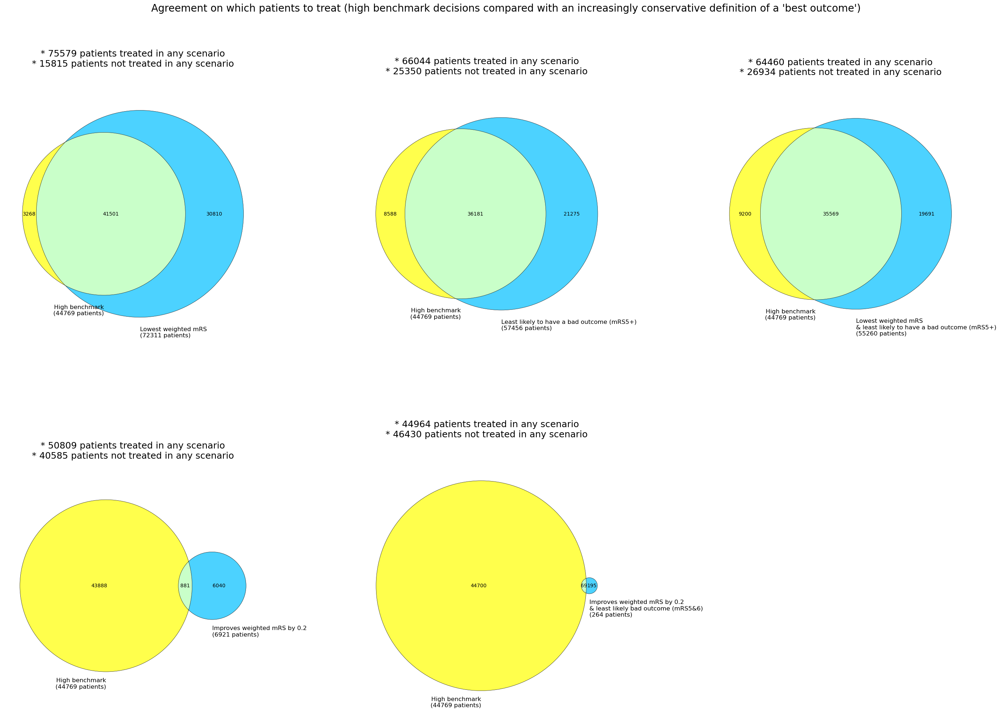

In [585]:
list_venn_diagram_columns = [["High_benchmark", "Lowest_weighted_mrs"],
                             ["High_benchmark", "Least_mrs5_6"],
                             ["High_benchmark", "Lowest_weighted_mrs_and_least_mrs5_6"],
                             ["High_benchmark", "Weighted_mrs_threshold_improvement"],
                             ["High_benchmark", "Weighted_mrs_threshold_improvement_and_least_mrs5_6"]]
list_xticks = []
for venn_diagram_columns in list_venn_diagram_columns:
    xticks = [dict_scenario_information[f"{col_name}_full_name"] for col_name in venn_diagram_columns]
    list_xticks.append(xticks)

fig = plt.figure(figsize=(28,22))

fig.suptitle("Agreement on which patients to treat (high benchmark decisions compared with an increasingly conservative definition of a 'best outcome')", fontsize=20)

for subplot, (venn_diagram_columns, xticks) in enumerate(zip(list_venn_diagram_columns, list_xticks)):
    ax1 = fig.add_subplot(2,3,subplot+1)

    create_venn_diagram(df_treatment_decision_per_scenario, 
                        venn_diagram_columns, xticks, ax=ax1, represent_as_100=False)
    
  
fig.tight_layout()

filename = os.path.join(paths.image_save_path, 
                        (paths.notebook + paths.model_text + 
                        f'_venn_diagram_{len(venn_diagram_columns)}scenarios.jpg'))

plt.savefig(filename, dpi=300)

Same figure, displaying values as per 100 patients.

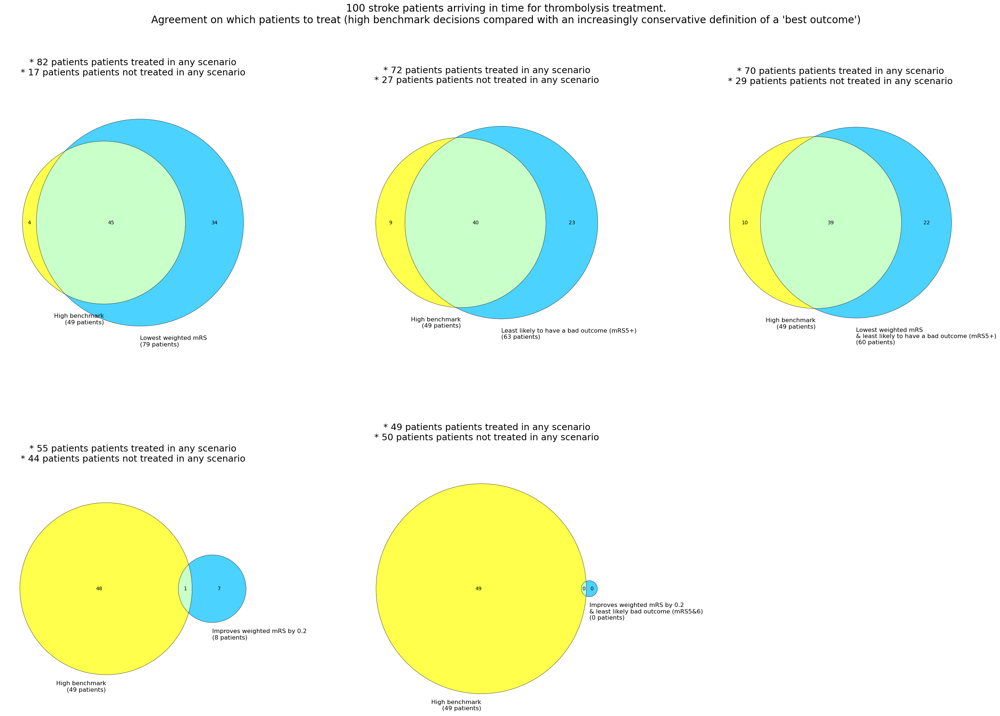

In [586]:
list_venn_diagram_columns = [["High_benchmark", "Lowest_weighted_mrs"],
                             ["High_benchmark", "Least_mrs5_6"],
                             ["High_benchmark", "Lowest_weighted_mrs_and_least_mrs5_6"],
                             ["High_benchmark", "Weighted_mrs_threshold_improvement"],
                             ["High_benchmark", "Weighted_mrs_threshold_improvement_and_least_mrs5_6"]]
list_xticks = []
for venn_diagram_columns in list_venn_diagram_columns:
    xticks = [dict_scenario_information[f"{col_name}_full_name"] for col_name in venn_diagram_columns]
    list_xticks.append(xticks)

fig = plt.figure(figsize=(28,22))

fig.suptitle("100 stroke patients arriving in time for thrombolysis treatment."
             "\nAgreement on which patients to treat (high benchmark decisions "
             "compared with an increasingly conservative definition of a "
             "'best outcome')", fontsize=20)

for subplot, (venn_diagram_columns, xticks) in enumerate(zip(list_venn_diagram_columns, list_xticks)):
    ax1 = fig.add_subplot(2,3,subplot+1)

    create_venn_diagram(df_treatment_decision_per_scenario, 
                        venn_diagram_columns, xticks, ax=ax1, represent_as_100=True)
    
  
fig.tight_layout()

filename = os.path.join(paths.image_save_path, 
                        (paths.notebook + paths.model_text + 
                        f'_venn_diagram_{len(venn_diagram_columns)}scenarios.jpg'))

plt.savefig(filename, dpi=300)

Leads us to ask, what are the differences in the patient characteristics between those getting treated in the different scenarios?

Which patients are the benchmark decisions choosing to treat that the model predicts there would not be an improvement (identfy the patient cohort to inform the hospitals to leave alone).
Which patients are the benchmark decisions choosing not to treat that the model predicts there would be an improvement (identfy the patient cohort to inform the hospitals to choose ot treat).

For this use the definitnion for 'best outcome' as 'Lower weighted mRS and a reduction in the likelihood of a bad outcome (mRS5+)'. How do we identify the 9200 patients that the benchmark decision shouldn't treat, and the 19691 patients that we should treat.

Can we unpick any patient characteristics where the benchmark decision to treat but the outcome scenario does not, and vice versa, can we also unpick any patient characteristics where benchmark hospitals do not treat, but the outcome scenario does?

In [587]:
def create_histogram_figures(df_treatment_decision_per_scenario,
                             data_for_histogram,
                             selected_features_set,
                             scenario_columns,
                             scenarios_short_name,
                             scenarios_full_name=""):

    # mask of the patients treated across any scenario
    either_mask = (df_treatment_decision_per_scenario[scenario_columns].sum(axis=1) > 0).values

    # mask of the patients treated in bm
    s1_mask = (df_treatment_decision_per_scenario[scenario_columns[0]] > 0).values

    # mask of the patients treated in outcome
    s2_mask = (df_treatment_decision_per_scenario[scenario_columns[1]] > 0).values

    # mask of the patients treated in bm only
    s1_only_mask = (s1_mask == 1) & (s2_mask == 0)

    # mask of the patients treated in outcome
    s2_only_mask = (s1_mask == 0) & (s2_mask == 1)

    # mask of the patients treated in both scenario
    both_mask = (df_treatment_decision_per_scenario[scenario_columns].sum(axis=1) == 2).values

    mask_patients = [either_mask, both_mask, s1_only_mask, s2_only_mask]

    labels = [f"Either scenario (n = {int(either_mask.sum())})", 
            f"Both scenarios (n = {int(both_mask.sum())})",
            f"'{scenarios_short_name[0]}' only (n = {int(s1_only_mask.sum())})", 
            f"'{scenarios_short_name[1]}' only (n = {int(s2_only_mask.sum())})" 
            ]

    n_subplots = len(labels)
    n_cols = 2
    n_rows = int(n_subplots/n_cols)

    for feat in selected_features_set:
        fig, axes = plt.subplots(n_rows, n_cols)

        plt.text(x=0.5, y=0.94, s=f"Feature: {feat}", fontsize=14, ha="center", transform=fig.transFigure)
        plt.text(x=0.5, y=0.89, s=f"Comparing scenarios: '{scenarios_short_name[0]}' vs '{scenarios_short_name[1]}'", fontsize=12, ha="center", transform=fig.transFigure)
        if len(scenarios_full_name)>0:
            plt.text(x=0.5, y=0.85, s=f"[where '{scenarios_short_name[1]}' is '{scenarios_full_name[1]}'", fontsize=8, ha="center", transform=fig.transFigure)

        # For each set of patients (all, bm, both, outcome)
        for (mask, label, ax) in zip(mask_patients, labels, axes.flatten()):
            if feat == "onset_to_thrombolysis_time":
                counts, bins = np.histogram(data_for_histogram[feat][mask])
                ax.hist(bins[:-1], bins, weights=counts)
            else:
                x = data_for_histogram[mask].groupby([feat]).count().index
                y = data_for_histogram[mask].groupby([feat]).count().iloc[:,0].values
                ax.bar(x,y)

            if feat == "stroke_team":
                ax.set_xticklabels([]);
            ax.set_title(label, fontsize=10)
            if data_for_histogram[feat].nunique() == 2:
                ax.set_xticks([0,1])

        plt.subplots_adjust(top=0.75, wspace=0.3, hspace=0.5)
        plt.show()
    return()

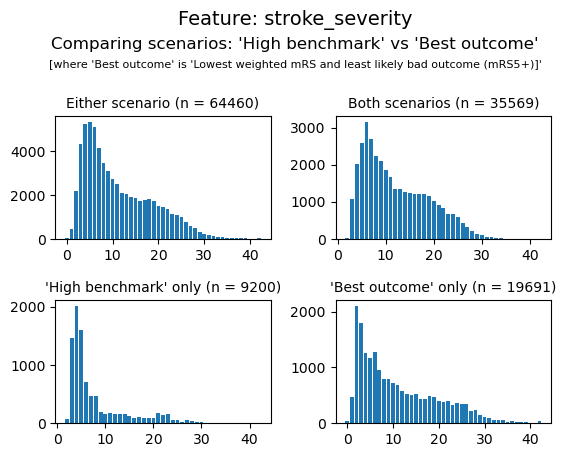

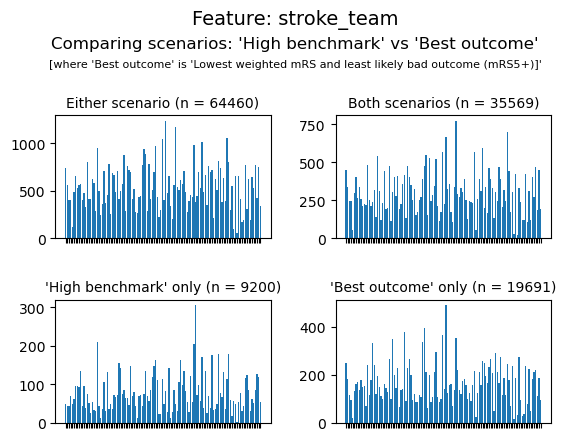

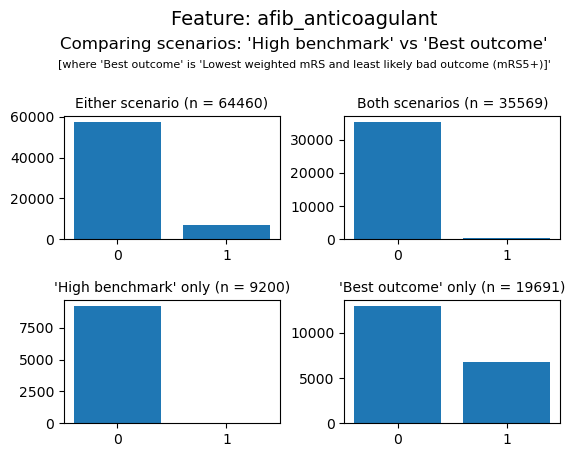

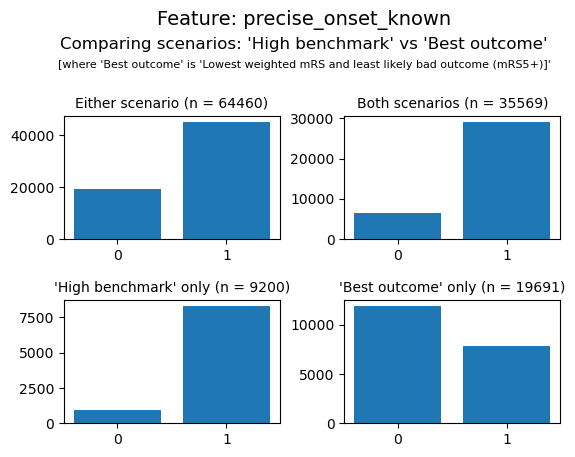

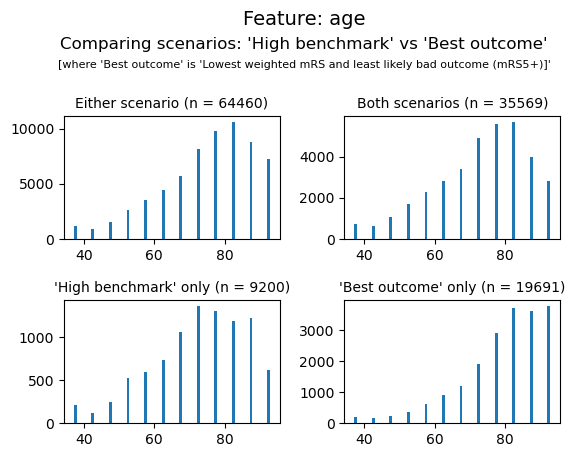

...

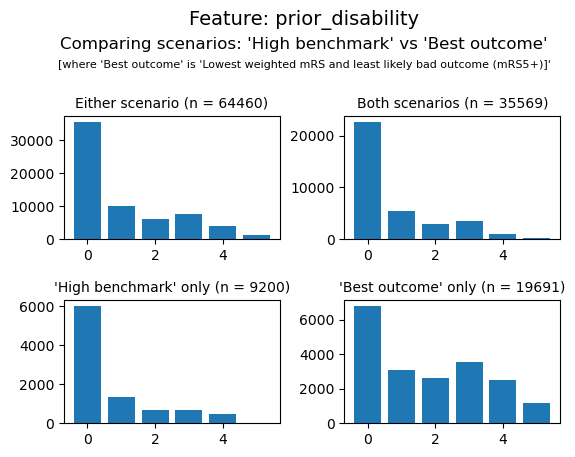

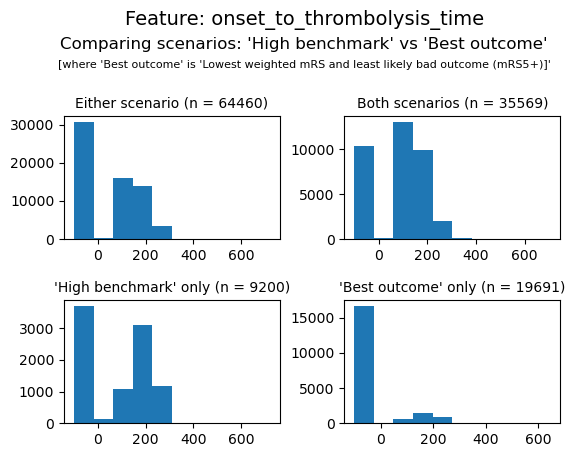

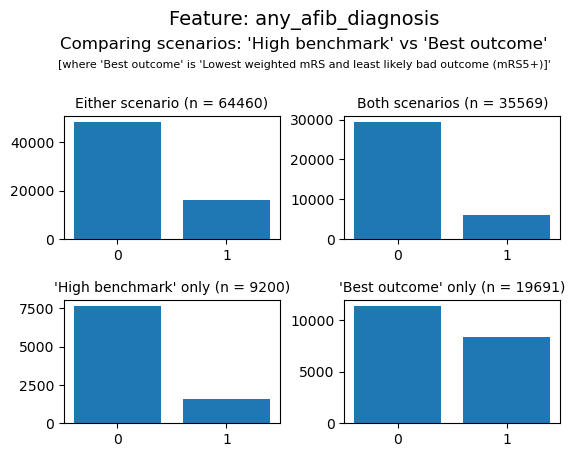

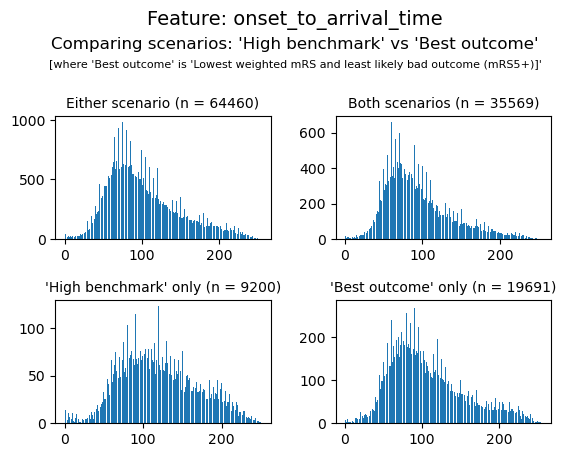

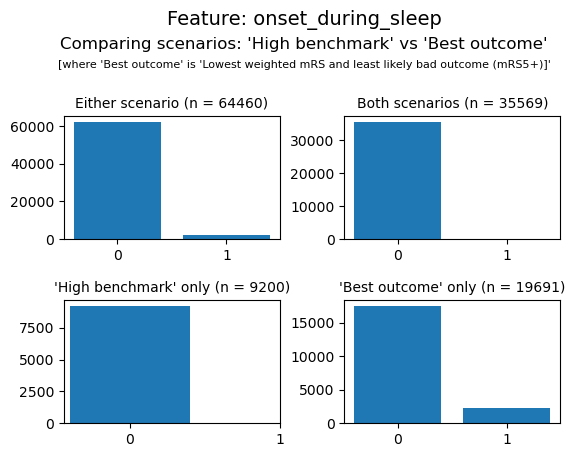

()

In [588]:
scenarios_columns = ["High_benchmark", "Lowest_weighted_mrs_and_least_mrs5_6"]
#xticks = [dict_scenario_information[f"{col_name}_full_name"] for col_name in scenarios_columns]
scenarios_short_name = ["High benchmark", "Best outcome"]
scenarios_full_name = ["High benchmark", 
                       "Lowest weighted mRS and least likely bad outcome (mRS5+)]"]

create_histogram_figures(df_treatment_decision_per_scenario, 
                         data_for_histogram,
                         selected_features_set,
                         scenarios_columns, 
                         scenarios_short_name,
                         scenarios_full_name)

Run two experiments.

1. Of the patients that should get treated (the population sample), fit a model to predict if each patient is treated from the patient characteristics. See the difference in the patients between the two groups. What's different for those patients that are not treated, but should.

2. Of the patients that should not get treated (the population sample), fit a model to predict if each patient is treated from the patient characteristics. See the difference in the patients between the two groups. What's different for those patients that are treated, but should not be.

In [589]:
filename = os.path.join(paths.data_save_path, 
                        '210_xgb_all_data_multiclass_outcome_onset_to_thrombolysis_time_all_treated.csv')

onset_to_thrombolysis_time_all_treated = pd.read_csv(filename)

In [590]:
s1_name = "Lowest_weighted_mrs_and_least_mrs5_6"
s2_name = "High_benchmark"

In [591]:
def switch_0_and_1(y):
    where_1 = np.where(y == 1)
    where_0 = np.where(y == 0)
    y[where_0] = 1
    y[where_1] = 0
    return(y)

In [592]:
# Create mask to extract the population sample: should get treated
mask_should_treat = df_treatment_decision_per_scenario[s1_name].astype(bool).values

# Get the X data
X = data_outcome.drop('discharge_disability', axis=1).copy(deep=True)
X["onset_to_thrombolysis_time"] = onset_to_thrombolysis_time_all_treated["onset_to_thrombolysis_time"].values
X = X[mask_should_treat]

# Get the y data
y = df_treatment_decision_per_scenario[s2_name][mask_should_treat].values
# Revere the target to represent "1" = should treated but are not, "0" = should treat, and do
y = switch_0_and_1(y)

In [593]:
def create_train_test_split(filename, X, y, test_size=0.25):

    # Check if exists
    file_exists = exists(filename)

    if file_exists:
    # Load data
        with open(filename, 'rb') as filehandler:
            dict = pickle.load(filehandler)
            
        X_train = dict["X_train"]
        X_test = dict["X_test"]
        y_train = dict["y_train"]
        y_test = dict["y_test"]

    else:
        # Create
        (X_train, X_test, y_train, y_test) = (
                            train_test_split(X, y, test_size=0.25))
        
        # And store in dictionary, to save
        dict = {}
        dict["X_train"] = X_train
        dict["X_test"] = X_test
        dict["y_train"] = y_train
        dict["y_test"] = y_test
    
        # Save
        with open(filename, 'wb') as filehandler:
            pickle.dump(dict, filehandler)
            
    return(X_train, X_test, y_train, y_test)


In [594]:
# Set up or load test and train data
filename = os.path.join(paths.model_save_path, 
                            (paths.notebook + 'dictionary_train_test_should.p'))

(X_train_should, X_test_should, y_train_should, y_test_should) = (
                        create_train_test_split(filename, X, y, test_size=0.25))

Extract the team name attended for each patient

In [595]:
stroke_team_test_should = X_test_should[ohe_stroke_team_feature_names].idxmax(axis=1)
stroke_team_test_should = [s.replace('team_', '') for s in stroke_team_test_should]

Create functions

In [596]:
def create_xgboost_model(filename, X_train, y_train):
    """
    Given the filename, either load if the model exists (saved as a pickle), 
    else return that user needs to run notebook 040 to create the model.

    Arg:
        filename [string]: where xgboost model is saved

    Return:
        model [model object]: xgboost classification model 
    """
    # Check if exists
    file_exists = exists(filename)

    if file_exists:
    # Load models
        with open(filename, 'rb') as filehandler:
            model = pickle.load(filehandler)
    else:
    # Create and save
        model = XGBClassifier(verbosity=0, seed=42, learning_rate=0.5,
                              tree_method='gpu_hist')
        model.fit(X_train, y_train)

        # Save using pickle
        with open(filename, 'wb') as filehandler:
            pickle.dump(model, filehandler)
            
    return(model)

Confusion matrix

In [597]:
def plot_cm(cm):

    fig, ax = plt.subplots(1,1)

    # Visualize the confusion matrix with colors
    heatmap = ax.imshow(cm, cmap=plt.cm.Blues, origin='lower')
    plt.colorbar(heatmap, ax=ax, alpha=0.5, label='Count')

    # Add values to plot
    for i in range(len(cm)):
        for j in range(len(cm[0])):
            ax.text(j, i, cm[i][j], ha='center', va='center', color='grey', 
                    size=8)

    # Set axis titles
    ax.set_xlabel('Predicted value')
    ax.set_ylabel('Observed value')

    return()

In [598]:
def create_coefficient_df(model, feature_names):
    coeff = model.coef_[0]
    coeff_df = pd.DataFrame() # create empty DataFrame
    coeff_df['feature'] = feature_names # Get feature names from X
    coeff_df['coeff'] = coeff
    coeff_df['abs_coeff'] = np.abs(coeff)
    coeff_df.sort_values(by='abs_coeff', ascending=False, inplace=True)
    return(coeff_df)

Receiver operating characteristic (ROC) Curve
We calculate the ROC curve by adjusting the probability cut-off (the probability cut-off of someone surviving in order to classify them as a survivor). Here we create a loop with cut-off probabilities in the range 0-1 in steps of 0.01. We do not need to refit the model – we take the same prediction probabilities output and apply varying cut-off thresholds to that output.

Calculating area of ROC
A common measurement from the ROC curve is to measure the area under the curve. A model that performs no better than guessing by random chance will have an area of 0.5. A perfect model will have an area of 1.0.
sklearn has a method for calculating the ROC area-under-curve, that we will use.

In [599]:
# Define a function for plotting the ROC curve
def plot_roc_curve(fpr, tpr):  
    plt.plot(fpr, tpr, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate (Sensitivity)')
    roc_auc = auc(fpr, tpr)
    plt.title(f'Receiver Operator Characteristic (ROC) Curve\n[ROCAUC: {roc_auc:0.3}]')
    plt.grid(True)
    plt.legend()
    plt.show()
    return()

### XGBoost

In [600]:
# Set up and fit model
filename = os.path.join(paths.model_save_path, 
                            (paths.notebook + paths.model_text + '_should.p'))
model_xgb_should = create_xgboost_model(filename, X_train_should, y_train_should)

# Predict training and test set labels
y_pred_train_xgb_should = model_xgb_should.predict(X_train_should)
y_pred_test_xgb_should = model_xgb_should.predict(X_test_should)

# Calculate accuracy of training and test sets
accuracy_train_should = np.mean(y_pred_train_xgb_should == y_train_should)
accuracy_test_should = np.mean(y_pred_test_xgb_should == y_test_should)

print ('Accuracy of predicting training data =', accuracy_train_should)
print ('Accuracy of predicting test data =', accuracy_test_should)

Accuracy of predicting training data = 0.9003981179876945
Accuracy of predicting test data = 0.8498009410061528


()

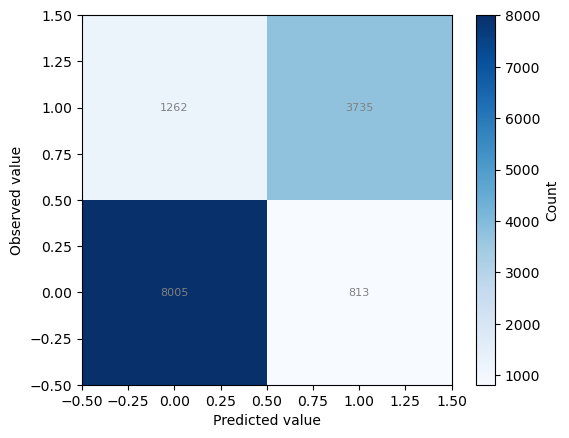

In [601]:
plot_cm(confusion_matrix(y_test_should, y_pred_test_xgb_should))

In [602]:
# Show first ten predicted probabilities 
# (note how the values relate to the classes predicted above)
probabilities_xgb = model_xgb_should.predict_proba(X_test_should)
probabilities_xgb[0:10]

array([[0.98567337, 0.01432664],
       [0.12593466, 0.87406534],
       [0.00139898, 0.998601  ],
       [0.93327844, 0.06672155],
       [0.5592598 , 0.4407402 ],
       [0.96021366, 0.03978632],
       [0.9938488 , 0.00615118],
       [0.85248125, 0.14751874],
       [0.82123697, 0.178763  ],
       [0.9243113 , 0.07568869]], dtype=float32)

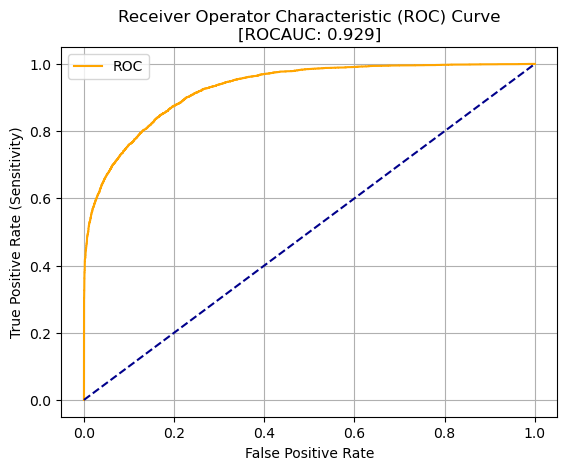

()

In [603]:
# Get ROC curve using sklearn method
fpr, tpr, thresholds = roc_curve(y_test_should, probabilities_xgb[:,1]) 

# Plot ROC curve
plot_roc_curve(fpr, tpr)

SHAP

Create function to return SHAP values extension X and y data for train and test sets

In [604]:
def calculate_shap_extended(model, X_train, X_test, filename, explainer_filename):
    """
    TreeExplainer is a fast and exact method to estimate SHAP values for tree 
    models and ensembles of trees. Using this we can calculate the SHAP values.

    Either load from pickle (if file exists), or calculate.

    Args:
        model [xgboost classification model object]: xgboost object
        X_train [dataframe]: training set (used as background data)
        X_test [dtaframe]: test set (to calculate the SHAP values for)

    Return:
        shap_values_extended [dictionary]: the extended shap values (contains 
                    .values, .base, and .data)
        
    """


    # Check if exists
    file_exists = exists(filename)

    if file_exists:
        # Load explainer
        with open(filename, 'rb') as filehandler:
            shap_values_extended = pickle.load(filehandler)
    else:
        # Calculate SHAP values
        
        # Set up explainer using the model and feature values from training set
        explainer = shap.TreeExplainer(model, X_train)

        # Get (and store) Shapley values along with base and feature values
        shap_values_extended = explainer(X_test)

        # Save explainer using pickle
        with open(explainer_filename, 'wb') as filehandler:
            pickle.dump(explainer, filehandler)
            
        # Save shap values extended using pickle
        with open(filename, 'wb') as filehandler:
            pickle.dump(shap_values_extended, filehandler)
        
    return(shap_values_extended)

In [605]:
# Set filename
filename = os.path.join(paths.data_save_path, 
                        (paths.notebook + paths.model_text + 
                            f'_shap_values_extended_{s1_name}_{s2_name}_should.p'))

explainer_filename = os.path.join(paths.data_save_path, 
                    (paths.notebook + paths.model_text + 
                        f'_shap_explainer_{s1_name}_{s2_name}_should.p'))

# Get and store SHAP values
shap_values_extended_should = calculate_shap_extended(model_xgb_should, X_train_should, X_test_should, 
                                               filename, explainer_filename)
shap_values_should = shap_values_extended_should.values


In [606]:
# Get and store feature importances
shap_feature_importance_df = pd.DataFrame() # create empty DataFrame
shap_feature_importance_df['feature'] = list(X) # Get feature names from X
shap_feature_importance_df['importance'] = model_xgb_should.feature_importances_
shap_feature_importance_df['abs(mean shap)'] = abs(shap_values_should.mean(axis=0))
shap_feature_importance_df['mean(abs shap)'] = abs(shap_values_should).mean(axis=0)
shap_feature_importance_df.sort_values(by='mean(abs shap)', ascending=False, inplace=True)

shap_feature_importance_df.head(20)

,feature,importance,abs(mean shap),mean(abs shap)
5,precise_onset_known,0.146622,0.161272,1.434888
1,stroke_severity,0.029395,0.170105,1.302042
0,prior_disability,0.040278,0.061708,1.152044
4,any_afib_diagnosis,0.069143,0.110843,0.806113
3,onset_to_thrombolysis_time,0.009469,0.070225,0.604961
2,age,0.006953,0.000671,0.288268
53,team_Norfolk and Norwich University Hospital,0.012696,0.015457,0.030715
52,team_New Cross Hospital,0.010889,0.011715,0.028146
83,team_Royal Stoke University Hospital,0.003907,0.019578,0.027487
99,team_Sunderland Royal Hospital,0.009534,0.008960,0.021723


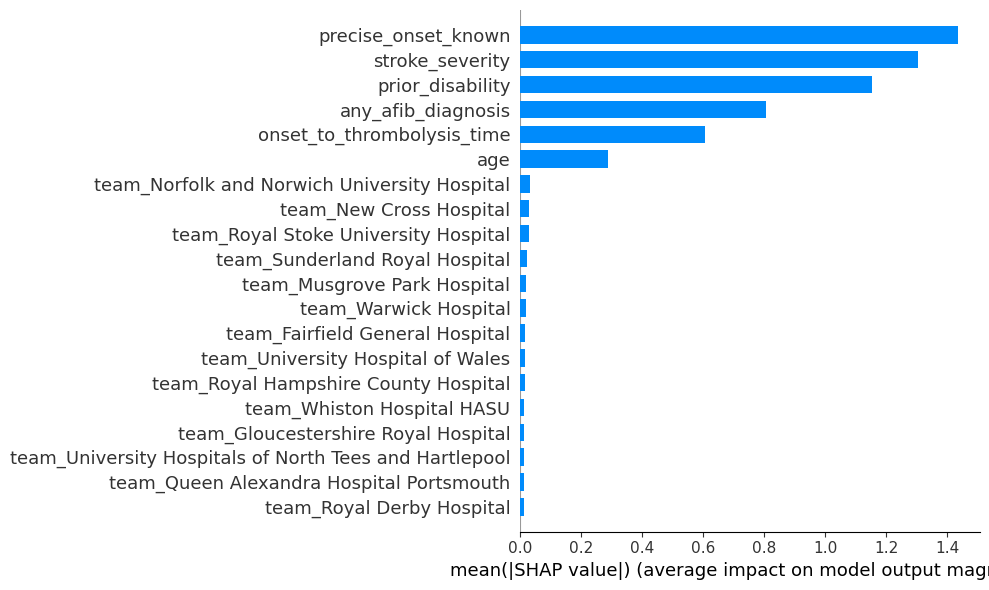

In [607]:
# Plot a SHAP summary plot, one for each k-fold
shap.summary_plot(shap_values_should, X_test_should.values, plot_type="bar", 
                  class_names=model_xgb_should.classes_, 
                  feature_names = list(X), class_inds="original",
                  show=False, plot_size=(10,6))

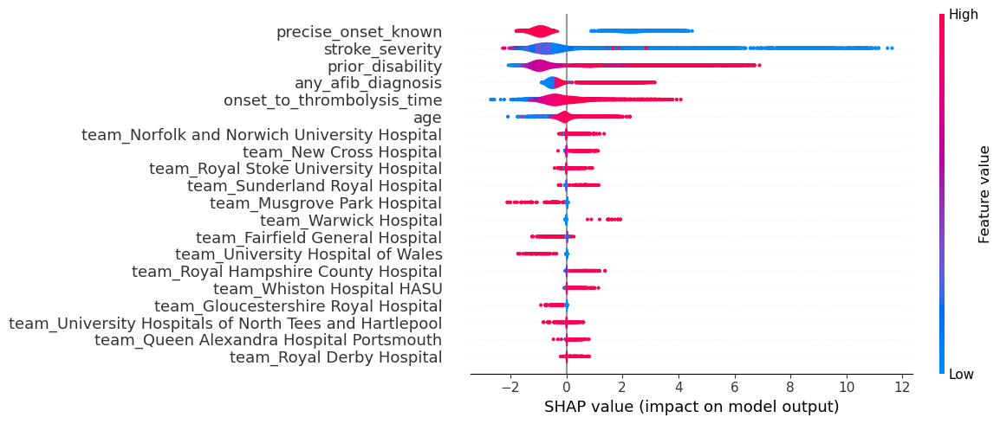

In [608]:
shap.summary_plot(shap_values_should, X_test_should.values, 
                    feature_names=X_test_should.columns, show=False, 
                    plot_size=(12,5), plot_type='violin')

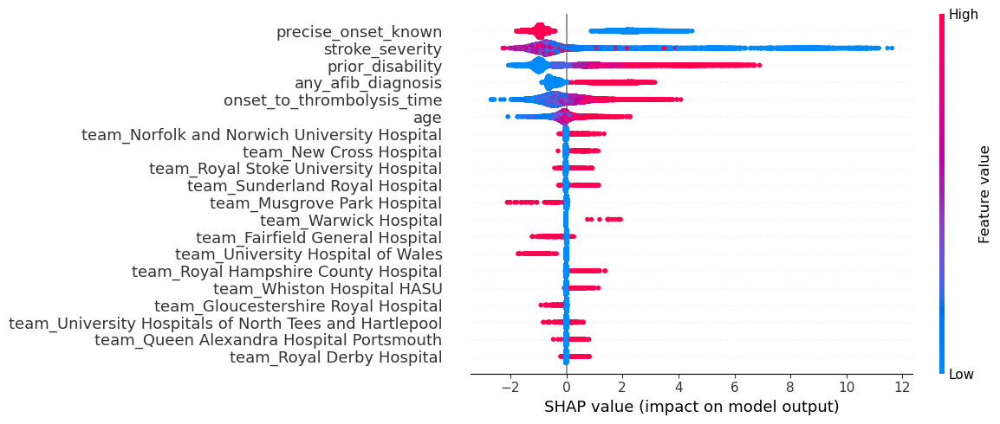

In [609]:
shap.summary_plot(shap_values_should, X_test_should.values, 
                    feature_names=X_test_should.columns, show=False, 
                    plot_size=(12,5))

Show the relationship between feature value and SHAP value for the top 6 influential features
(as violin plots)

Resource: https://towardsdatascience.com/binning-records-on-a-continuous-variable-with-pandas-cut-and-qcut-5d7c8e11d7b0 https://matplotlib.org/3.1.0/gallery/statistics/customized_violin.html

In [610]:
def set_ax(ax, category_list, feat, rotation=0):
    '''
    ax [matplotlib axis object] = matplotlib axis object
    category_list [list] = used for the xtick labels (the grouping of the data)
    feat [string] = used in the axis label, the feature that is being plotted
    rotation [integer] = xtick label rotation
    
    resource: 
    https://matplotlib.org/3.1.0/gallery/statistics/customized_violin.html
    '''
    # Set the axes ranges and axes labels
    ax.get_xaxis().set_tick_params(direction='out')
    ax.xaxis.set_ticks_position('bottom')
    ax.set_xticks(np.arange(1, len(category_list) + 1))
    ax.set_xticklabels(category_list, rotation=rotation, fontsize=10)
    ax.set_xlim(0.25, len(category_list) + 0.75)
    ax.set_ylabel(f'SHAP values for {feat}', fontsize=12)
    ax.set_xlabel(f'Feature values for {feat}', fontsize=12)
    return(ax)

In [611]:
def create_grid_of_violin_plots(features_violin, 
                                shap_values_extended,
                                title,
                                filename
                                ):
    """
    Create a grid of violin plots (with each violin plot showing the 
    relationship between feature value and its SHAP value.

    Depending on the feature, there are some special cases for the plot layout.
   
    Args:
        features_violin [list]: list of features to create a violin plot
        class_category [integer]: the class to show
        shap_values_extended [shap_values variable]: shap values for a kfold
                (with three attributes: .values, .base_values and .data)
        
    Return:
        None
    
    """
    # Feature Age needs special consideration. It needs the x ticks to be created,
    # as the other features with over 50 unique values, but age is already grouped 
    # for the model (into 5yr groups) and so is treated as the other type.

    # Create figure
    fig = plt.figure(figsize=(12,14), constrained_layout=True)


    fig.suptitle(title, 
                 fontsize=20)

    # A subplot showing violin plot for each feature.
    # First prepare the fature data for the violin plot: if feature has more than 
    # 50 unique values then assume it needs to be binned (a violin for each bin)

    # Determine number of rows of subplots by rounding up
    ncols = 2
    nrows = math.ceil(len(features_violin)/ncols)

    # Through each feature
    for n, feat in enumerate(features_violin):    
        
        # Get data and SHAP values
        feature_data = shap_values_extended[:, feat].data
        feature_shap = shap_values_extended[:, feat].values

        # If feature has more that 50 unique values, then assume it needs to be 
        # binned (otherwise assume they are unique categories)

        if np.unique(feature_data).shape[0] > 50:
            # bin the data, create a violin per bin
            
            # settings for the plot
            rotation = 45
            step = 30
            n_bins = min(11, np.int((feature_data.max())/step))
            
            # create list of bin values
            bin_list = [(i*step) for i in range(n_bins)]
            bin_list.append(feature_data.max())
            if feat == "onset_to_thrombolysis_time" and feature_data.min() < 0:
                # for -100 for no IVT
                bin_list.insert(0, feature_data.min())

            # Number of instances per bin
            counts, edges = np.histogram(feature_data, bins=bin_list, density=False)

            # create list of bins (the unique categories)
            category_list = [f'{i*step}-{((i+1)*step-1)}\n[n={int(counts[i+1])}]' for i in range(n_bins-1)]
            category_list.append(f'{(n_bins-1)*step}+\n[n={int(counts[-1])}]')
            if feat == "onset_to_thrombolysis_time" and feature_data.min() < 0:
                # for -100 for no IVT
                category_list.insert(0, f'Not receive IVT\n[n={int(counts[0])}]')

            # bin the feature data
            feature_data = pd.cut(feature_data, bin_list, labels=category_list, 
                                right=False)

            # create a list, each entry contains the corresponsing SHAP value for that 
            # category (or bin). A violin will represent each list.    
            shap_per_category = []
            for category in category_list:
                mask = feature_data == category
                shap_per_category.append(feature_shap[mask])

        else:
            # create a violin per unique value
            
            # settings for the plot
            rotation = 90
            
            # create list of unique categories in the feature data
            category_list = np.unique(feature_data)

            # Age needs to keep its decimal value (midpoint between 5 yrs)
            if feat != 'age':
                category_list = [int(i) for i in category_list]

            # create a list, each entry contains the corresponsing SHAP value for that 
            # category (or bin). A violin will represent each list.    
            count = []
            shap_per_category = []
            for category in category_list:
                mask = feature_data == category
                shap_per_category.append(feature_shap[mask])
                count.append(mask.sum())

            if feat == 'age':
                # create text of x ticks
                category_list = [f'{int(i-2.5)}-{int(i+2.5)}' for i in category_list]

                # SSNAP dataset had oldest age category as 100-120 (not a 5 yr band as 
                #   the other ages). To accommodate this, if last age category is "110"
                #   then overwrite the label with the correct band (100-120), and not
                #   107-112 as the above code would create.
                if category_list[-1] == '107-112':
                    category_list[-1] = '100-120'
            if feat == 'stroke_severity':
                # not enough space of chart for 2 lines fo x tick labels
                category_list = [f'{category_list[i]} [n={count[i]}]' for i in range(len(category_list))]
            else:
                category_list = [f'{category_list[i]}\n[n={count[i]}]' for i in range(len(category_list))]

        # create violin plot
        ax = fig.add_subplot(nrows,ncols,n+1)

        nans = [float('nan'), float('nan')] # requires at least 2 nans

        ax.violinplot([val if val.any() else nans for val in shap_per_category], 
                       showmeans=True, widths=0.9, showextrema=False)

        # Add line at Shap = 0
        feature_values = shap_values_extended[:, feat].data
        ax.plot([0, len(feature_values)], [0,0],c='0.5')   

        # customise the axes
        ax = set_ax(ax, category_list, feat, rotation=rotation)
        plt.subplots_adjust(bottom=0.15, wspace=0.05)

        # Adjust stroke severity tickmarks
        if feat == 'Stroke severity':
            ax.set_xticks(np.arange(1, len(category_list)+1, 2))
            ax.set_xticklabels(category_list[0::2])   
            
        # Add title
        ax.set_title(feat)
        
    plt.tight_layout(pad=2)
        
    fig.savefig(filename, 
                dpi=300, bbox_inches='tight', pad_inches=0.2)

    plt.show()
    return()

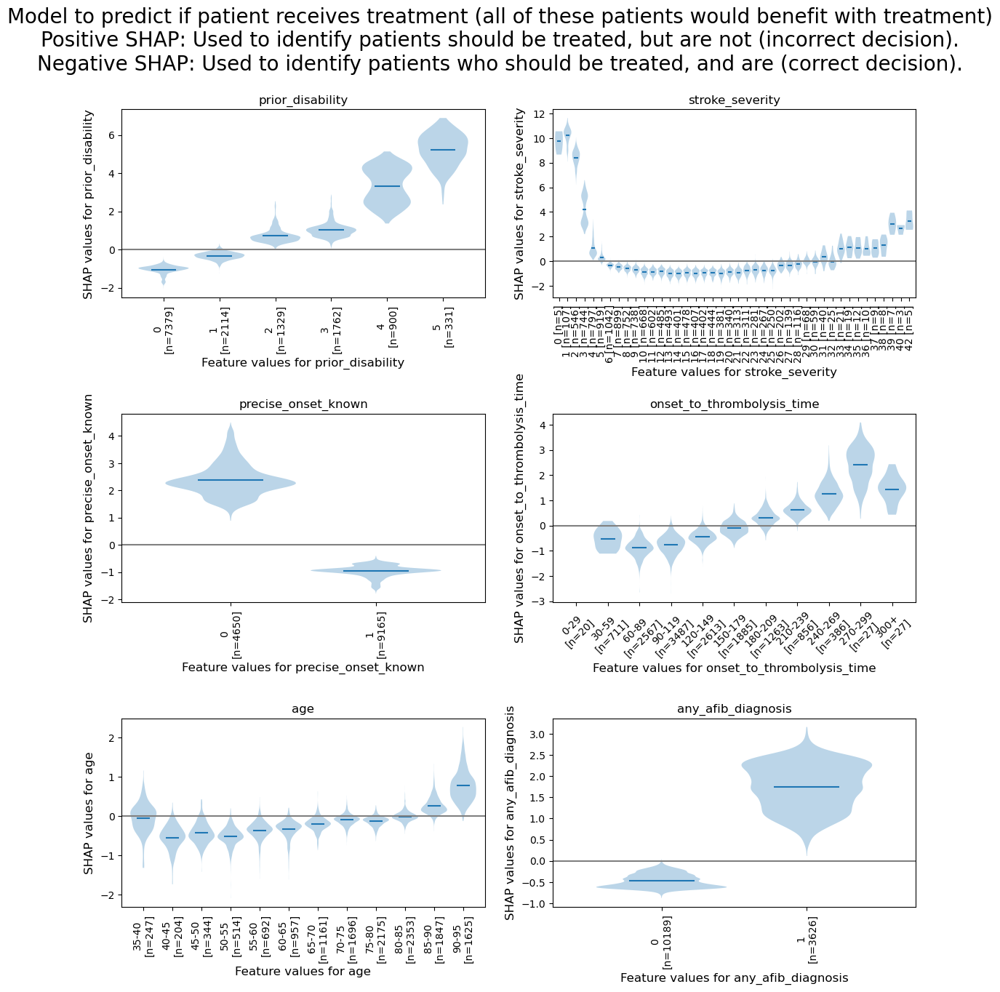

()

In [612]:
# Features to include in the violin plot grid
features_violin = ["prior_disability", "stroke_severity", "precise_onset_known",
                "onset_to_thrombolysis_time", "age", "any_afib_diagnosis"]
filename = os.path.join(paths.image_save_path, (paths.notebook + 
                        paths.model_text + 
                        f'_thrombolysis_shap_violin_all_features_all_benefit_with_ivt_{s1_name}_{s2_name}_should.jpg'))

title = "Model to predict if patient receives treatment (all of these patients would benefit with treatment)\nPositive SHAP: Used to identify patients should be treated, but are not (incorrect decision).\nNegative SHAP: Used to identify patients who should be treated, and are (correct decision)."
create_grid_of_violin_plots(features_violin, 
                            shap_values_extended_should,
                            title,
                            filename)

In [613]:
def create_grid_of_dependence_plots(features_to_show, title, shap_values, X_test, feature_names_ohe, filename):

    n_features_show = len(features_to_show)


    # Create a matrix of subplots. Each showing the relationship between
    # each combination of features on the SHAP value.

    # setup matrix of subplots
    fig, axes = plt.subplots(nrows=n_features_show,
                             ncols=n_features_show)
    axes = axes.ravel()

    # Set overall title
    fig.suptitle(title, fontsize=30)

    # Initialise subplot counter
    count = 0

    # Loop through the features to display
    for i in range(len(features_to_show)):
        # Loop through the features to display
        for j in range(len(features_to_show)):
            # Create the plot. Pass the axes
            shap.dependence_plot(ind=features_to_show[i], 
                                interaction_index=features_to_show[j], 
                                shap_values=shap_values, 
                                features=X_test.values, 
                                feature_names=X_test.columns,
                                show=False, ax=axes[count],
                                alpha=0.1);
            
            # Add line as shap=0
            axes[count].plot([-1, X_test[feature_names_ohe[i]].max()+1],
                                [0,0],c='0.5')
            
            # Increase subplot counter
            count+=1

    # Change font size for each subplot
    for ax in axes:
        ax.set_xlabel(ax.get_xlabel(), fontsize=15)
        ax.set_ylabel(ax.get_ylabel(), fontsize=15)
        ax.tick_params(axis='both',which='major',labelsize=15)

        # Visual properties of figure
        dimension = 5 * 5
        fig.set_figheight(dimension)
        fig.set_figwidth(dimension)
        fig.tight_layout(pad=2)

    plt.savefig(filename, dpi=300)

    plt.show()
    return()

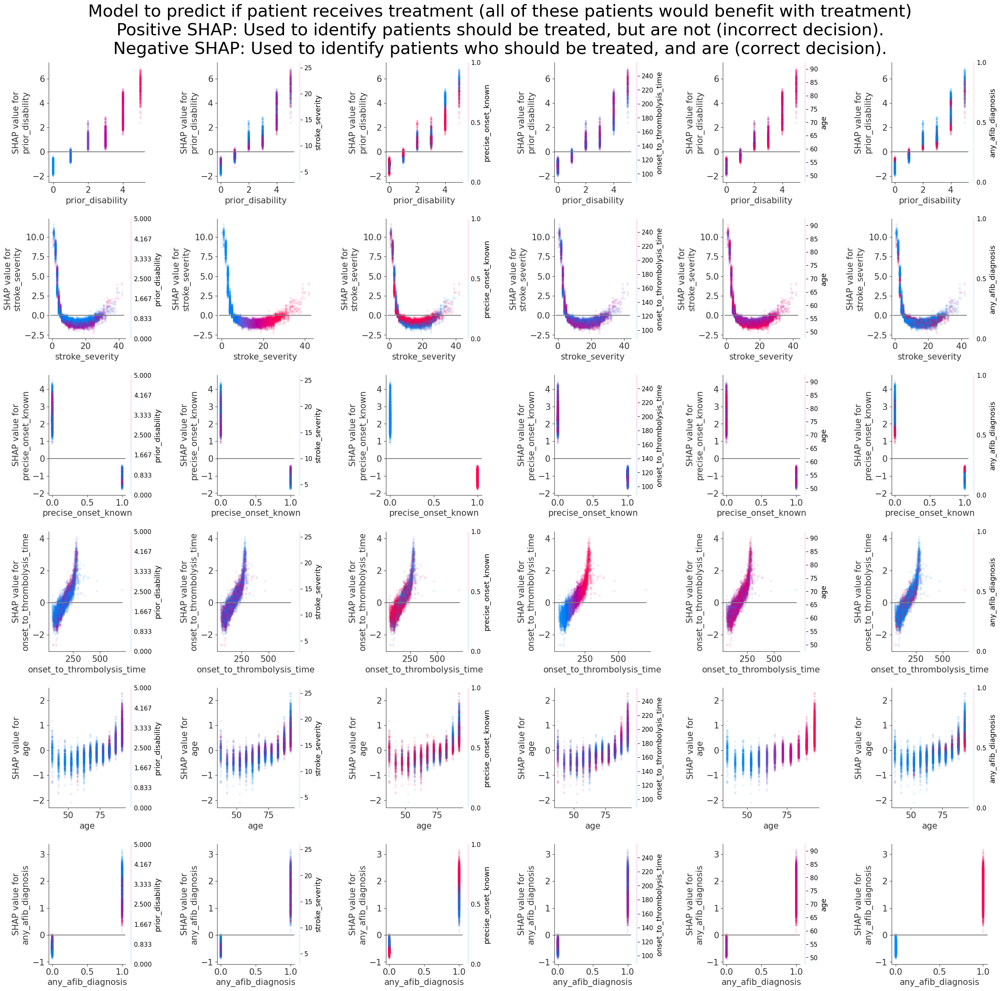

()

In [614]:
features_to_show = ["prior_disability", "stroke_severity", "precise_onset_known",
                    "onset_to_thrombolysis_time", "age", "any_afib_diagnosis"]
title = "Model to predict if patient receives treatment (all of these patients would benefit with treatment)\nPositive SHAP: Used to identify patients should be treated, but are not (incorrect decision).\nNegative SHAP: Used to identify patients who should be treated, and are (correct decision)."
filename = os.path.join(paths.image_save_path, 
                            (paths.notebook + paths.model_text + 
                        f'_grid_of_dependency_plots_all_benefit_with_ivt_{s1_name}_{s2_name}.jpg'))
create_grid_of_dependence_plots(features_to_show, title, shap_values_should, X_test_should, feature_names_ohe, filename)


Compare SHAP values for the hospital one-hot encoded features
The hospital feature is one-hot encoded, so there is a SHAP value per stroke team. We will use this to create a histogram of the frequency of the SHAP value for the hospital feature (using only the first k-fold test set, and take the mean of the SHAP values for the instances for each hospital's own patients).

In [615]:
def create_stroke_team_mean_shap_for_histogram(stroke_team_per_patient, 
                                               shap_values, feature_names_ohe, 
                                               X_test):


    # Set up list for storing patient data and hospital SHAP
    feature_data_with_shap = []

    # Get mean SHAP for stroke team when patient attending that stroke team
    stroke_teams = list(np.unique(stroke_team_per_patient))
    stroke_teams.sort()
    stroke_team_mean_shap = []
    # Loop through stroke teams

    for stroke_team in stroke_teams:
        # Identify rows in test data that match each stroke team
        mask = np.array(stroke_team_per_patient) == stroke_team
        stroke_team_shap_all_features = shap_values[mask]
        # Get column index for stroke_team_in_shap
        feature_name = 'team_' + stroke_team
        index = feature_names_ohe.index(feature_name)
        # Get SHAP values for hospital
        stroke_team_shap = stroke_team_shap_all_features[:, index]
        # Get mean
        mean_shap = np.mean(stroke_team_shap)
        # Store mean
        stroke_team_mean_shap.append(mean_shap)
        # Get and store feature data and add SHAP
        feature_data = X_test[mask]
        feature_data['Hospital_SHAP'] = stroke_team_shap
        feature_data_with_shap.append(feature_data)

    # Concatenate and save feature_data_with_shap
    feature_data_with_shap = pd.concat(feature_data_with_shap, axis=0)

    filename = os.path.join(paths.data_save_path, 
                            (paths.notebook + paths.model_text + 
                            '_feature_data_with_hospital_shap.jpg'))

    feature_data_with_shap.to_csv(filename, index=False)

    # Create and save shap mean value per hospital
    hospital_data = pd.DataFrame()
    hospital_data["stroke_team"] = stroke_teams
    hospital_data["shap_mean"] = stroke_team_mean_shap

    filename = os.path.join(paths.data_save_path, 
                            (paths.notebook + paths.model_text + 
                            '_mean_shap_per_hospital.csv'))

    hospital_data.to_csv(filename, index=False)
    return(stroke_team_mean_shap)

Plot histogram of the frequency of the mean SHAP value for the instances for each hospital's own patients (using only the first k-fold test set)


In [616]:
stroke_team_mean_shap_should = create_stroke_team_mean_shap_for_histogram(stroke_team_test_should, shap_values_should, feature_names_ohe, X_test_should)


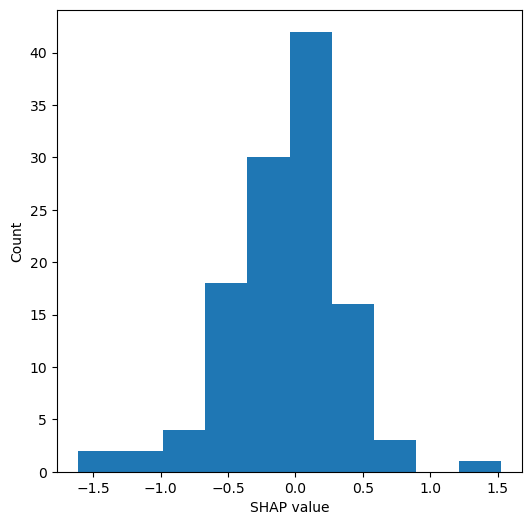

In [617]:
# Plot histogram
fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot()
ax.hist(stroke_team_mean_shap_should)#, bins=np.arange(-1.5, 1.51, 0.1))
ax.set_xlabel('SHAP value')
ax.set_ylabel('Count')

filename = os.path.join(paths.data_save_path, 
                        (paths.notebook + paths.model_text + 
                         '_hosp_shap_hist_should.jpg'))
plt.savefig(filename, dpi=300, bbox_inches='tight', pad_inches=0.2)
plt.show()

## Fit model to predict if get treatment, of those that should not.

In [618]:
# Create mask to extract the population sample: should not treat
mask_should_not_treat = np.invert(mask_should_treat)

# Get the X data
X = data_outcome.drop('discharge_disability', axis=1).copy(deep=True)
X["onset_to_thrombolysis_time"] = onset_to_thrombolysis_time_all_treated["onset_to_thrombolysis_time"].values
X_should_not = X[mask_should_not_treat]

# Get the y data
y_should_not = df_treatment_decision_per_scenario[s2_name][mask_should_not_treat].values

In [619]:
# Set up or load test and train data
filename = os.path.join(paths.model_save_path, 
                            (paths.notebook + 'dictionary_train_test_should_not.p'))

(X_train_should_not, X_test_should_not, y_train_should_not, y_test_should_not) = (
                        create_train_test_split(filename, X_should_not, y_should_not, test_size=0.25))

Stroke team attended for patients in the X_test_should_not (converting from one hot encoded to list of hospitals)

In [620]:
team_col_names_should_not = [col for col in list(X_test_should_not) if "team_" in col]
stroke_team_test_should_not = X_test_should_not[team_col_names_should_not].idxmax(axis=1)
stroke_team_test_should_not = [s.replace('team_', '') for s in stroke_team_test_should_not]

In [621]:
# Set up and fit model
filename = os.path.join(paths.model_save_path, 
                            (paths.notebook + paths.model_text + '_should_not.p'))
model_xgb_should_not = create_xgboost_model(filename, X_train_should_not, y_train_should_not)

# Predict training and test set labels
y_pred_train_xgb_should_not = model_xgb_should_not.predict(X_train_should_not)
y_pred_test_xgb_should_not = model_xgb_should_not.predict(X_test_should_not)

# Calculate accuracy of training and test sets
accuracy_train_should_not = np.mean(y_pred_train_xgb_should_not == y_train_should_not)
accuracy_test_should_not = np.mean(y_pred_test_xgb_should_not == y_test_should_not)

print ('Accuracy of predicting training data =', accuracy_train_should_not)
print ('Accuracy of predicting test data =', accuracy_test_should_not)



Accuracy of predicting training data = 0.9511070110701108
Accuracy of predicting test data = 0.909342483949524


()

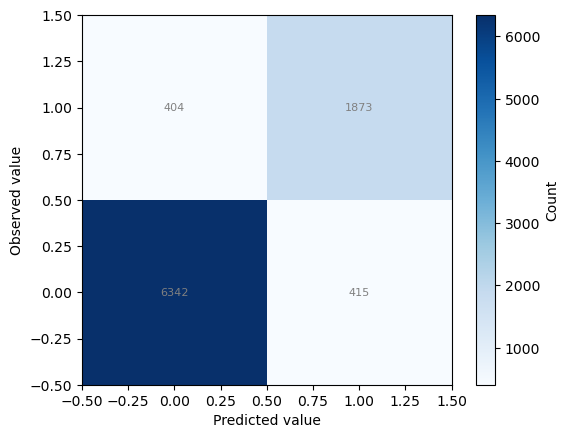

In [622]:
plot_cm(confusion_matrix(y_test_should_not, y_pred_test_xgb_should_not))

In [623]:
# Show first ten predicted probabilities 
# (note how the values relate to the classes predicted above)
probabilities_xgb_should_not = model_xgb_should_not.predict_proba(X_test_should_not)
probabilities_xgb_should_not[0:10]

array([[2.9521644e-02, 9.7047836e-01],
       [9.9999630e-01, 3.7062598e-06],
       [9.9998271e-01, 1.7258773e-05],
       [9.9993289e-01, 6.7103181e-05],
       [9.9390274e-01, 6.0972325e-03],
       [9.6994507e-01, 3.0054923e-02],
       [9.9914277e-01, 8.5723028e-04],
       [9.9999458e-01, 5.4209572e-06],
       [7.5506532e-01, 2.4493471e-01],
       [2.6447695e-01, 7.3552305e-01]], dtype=float32)

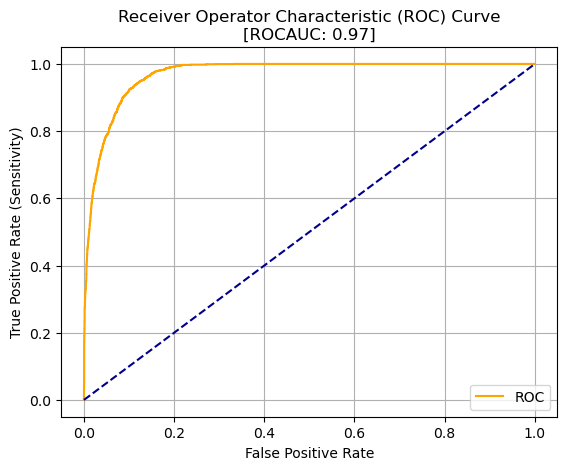

()

In [624]:
# Get ROC curve using sklearn method
fpr, tpr, thresholds = roc_curve(y_test_should_not, probabilities_xgb_should_not[:,1]) 

# Plot ROC curve
plot_roc_curve(fpr, tpr)

In [625]:
# Set filename
filename = os.path.join(paths.data_save_path, 
                        (paths.notebook + paths.model_text + 
                            f'_shap_values_extended_should_not_{s1_name}_{s2_name}.p'))

explainer_filename = os.path.join(paths.data_save_path, 
                    (paths.notebook + paths.model_text + 
                        f'_shap_explainer_should_not_{s1_name}_{s2_name}.p'))

# Get and store SHAP values
shap_values_extended_should_not = calculate_shap_extended(model_xgb_should_not, X_train_should_not, X_test_should_not, filename, explainer_filename)
shap_values_should_not = shap_values_extended_should_not.values

In [626]:
# Get and store feature importances
shap_feature_importance_should_not_df = pd.DataFrame() # create empty DataFrame
shap_feature_importance_should_not_df['feature'] = list(X) # Get feature names from X
shap_feature_importance_should_not_df['importance'] = model_xgb_should_not.feature_importances_
shap_feature_importance_should_not_df['abs(mean shap)'] = abs(shap_values_should_not.mean(axis=0))
shap_feature_importance_should_not_df['mean(abs shap)'] = abs(shap_values_should_not).mean(axis=0)
shap_feature_importance_should_not_df.sort_values(by='mean(abs shap)', ascending=False, inplace=True)

shap_feature_importance_should_not_df.head(20)

,feature,importance,abs(mean shap),mean(abs shap)
1,stroke_severity,0.092544,0.024002,4.871552
5,precise_onset_known,0.159812,0.007213,1.721600
0,prior_disability,0.040240,0.016761,1.305739
3,onset_to_thrombolysis_time,0.009927,0.104672,0.670475
2,age,0.008368,0.076801,0.598450
4,any_afib_diagnosis,0.030422,0.044342,0.318976
74,team_Royal Cornwall Hospital,0.005474,0.019391,0.036427
25,team_Fairfield General Hospital,0.009473,0.000200,0.032631
22,team_East Surrey Hospital,0.008984,0.014801,0.032604
121,team_Yeovil District Hospital,0.004030,0.015866,0.029185


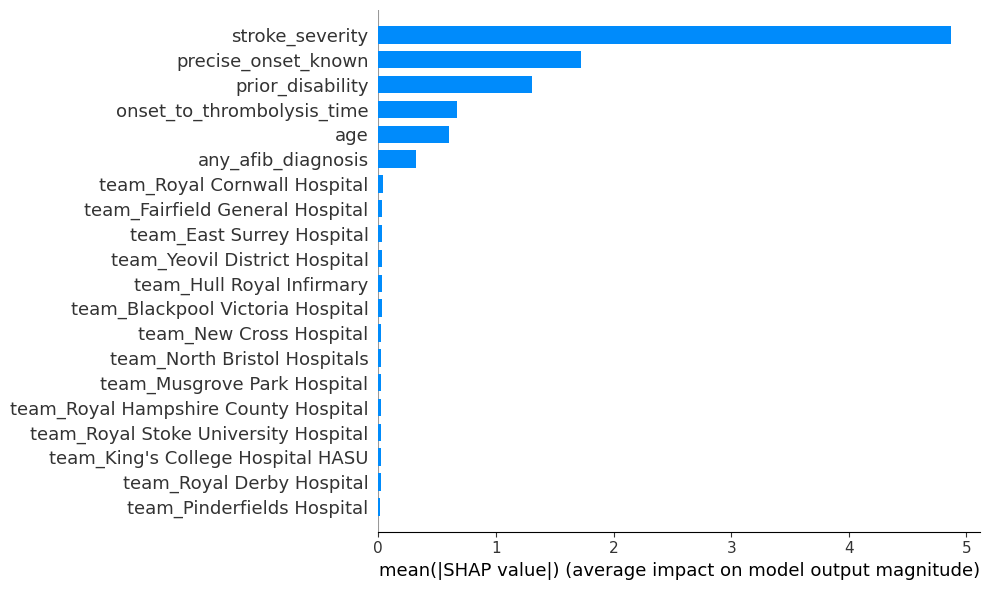

In [627]:
# Plot a SHAP summary plot, one for each k-fold
shap.summary_plot(shap_values_should_not, X_test_should_not.values, plot_type="bar", 
                  class_names=model_xgb_should_not.classes_, 
                  feature_names = list(X), class_inds="original",
                  show=False, plot_size=(10,6))


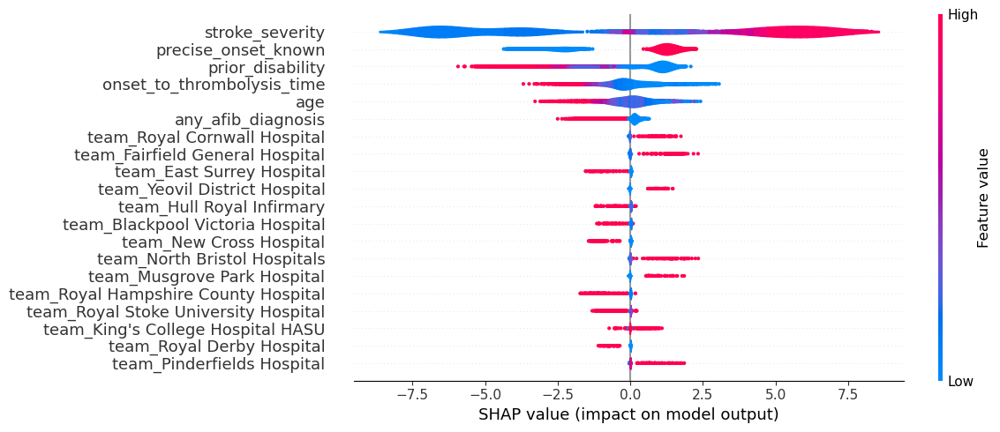

In [628]:
shap.summary_plot(shap_values_should_not, X_test_should_not.values, 
                  feature_names=X_test_should_not.columns, show=False, 
                    plot_size=(12,5), plot_type='violin')

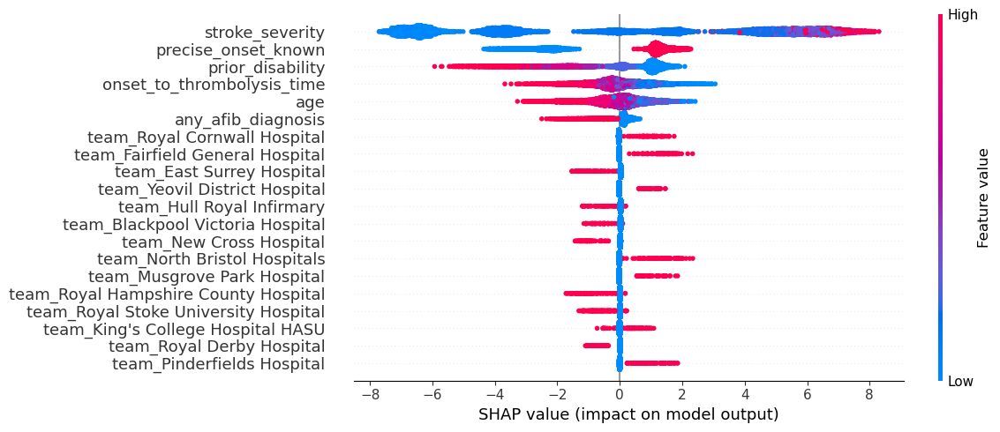

In [629]:
shap.summary_plot(shap_values_should_not, X_test_should_not.values, 
                    feature_names=X_test_should_not.columns, show=False, 
                    plot_size=(12,5))   

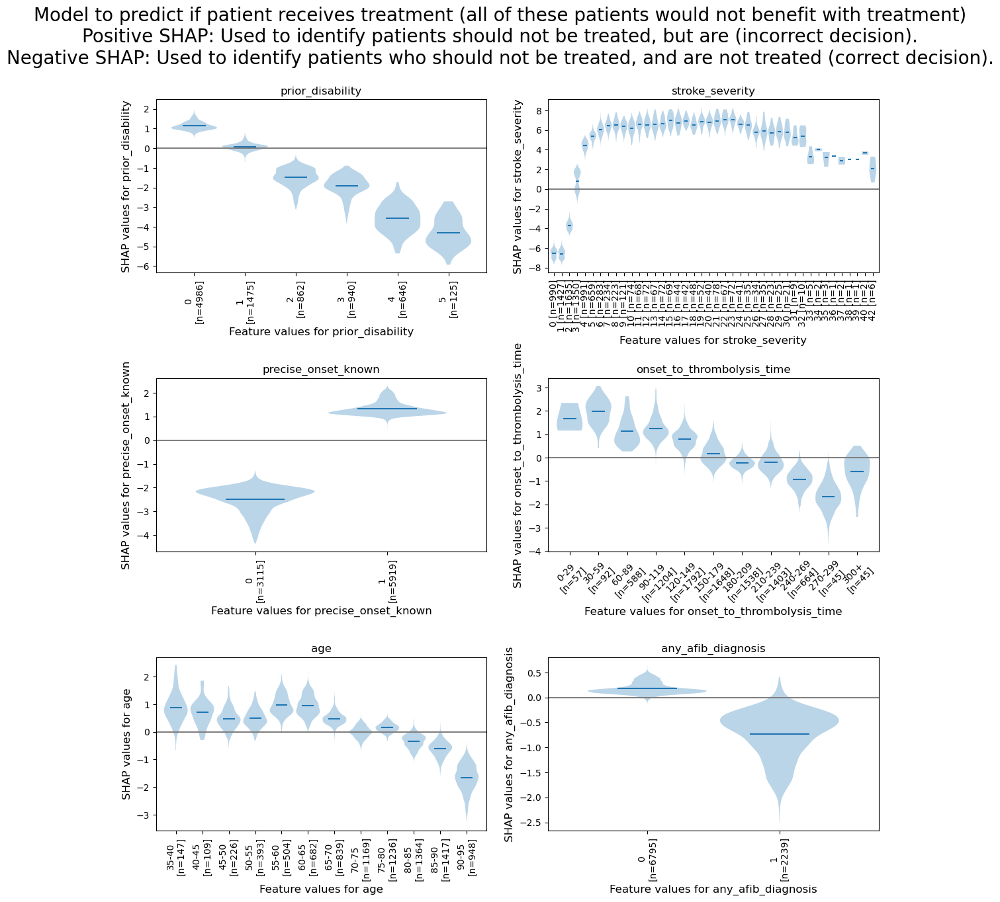

()

In [630]:
# Features to include in the violin plot grid
features_violin = ["prior_disability", "stroke_severity", "precise_onset_known",
                "onset_to_thrombolysis_time", "age", "any_afib_diagnosis"]

filename = os.path.join(paths.image_save_path, (paths.notebook + 
                        paths.model_text + 
                        f'_thrombolysis_shap_violin_all_features_none_benefit_with_ivt_{s1_name}_{s2_name}.jpg'))

title = "Model to predict if patient receives treatment (all of these patients would not benefit with treatment)"
title = "Model to predict if patient receives treatment (all of these patients would not benefit with treatment)\nPositive SHAP: Used to identify patients should not be treated, but are (incorrect decision).\nNegative SHAP: Used to identify patients who should not be treated, and are not treated (correct decision)."

create_grid_of_violin_plots(features_violin, 
                            shap_values_extended_should_not,
                            title,
                            filename)

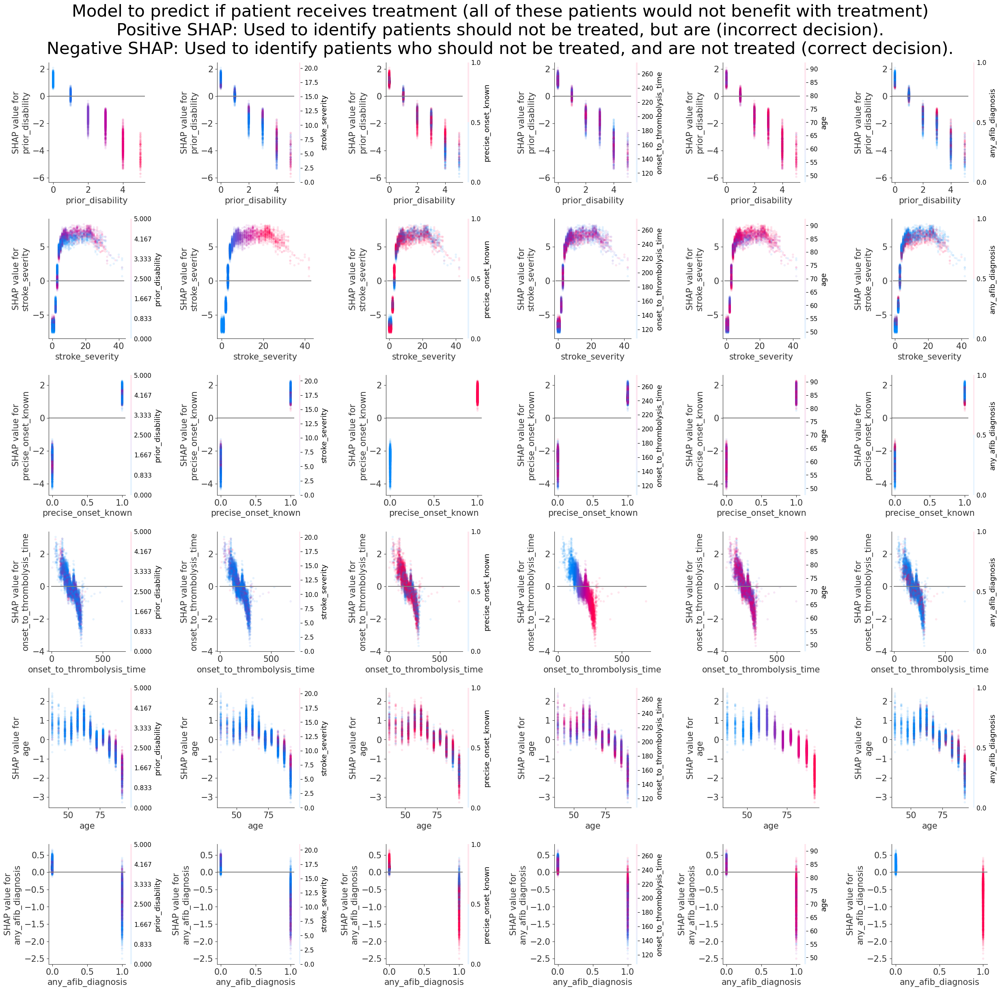

()

In [631]:
features_to_show = ["prior_disability", "stroke_severity", "precise_onset_known",
                    "onset_to_thrombolysis_time", "age", "any_afib_diagnosis"]
title = "Model to predict if patient receives treatment (all of these patients would not benefit with treatment)\nPositive SHAP: Used to identify patients should not be treated, but are (incorrect decision).\nNegative SHAP: Used to identify patients who should not be treated, and are not treated (correct decision)."
filename = os.path.join(paths.image_save_path, 
                            (paths.notebook + paths.model_text + 
                        f'_grid_of_dependency_plots_none_benefit_with_ivt_{s1_name}_{s2_name}.jpg'))
create_grid_of_dependence_plots(features_to_show, title, shap_values_should_not, X_test_should_not, feature_names_ohe, filename)

Create histogram for hospital attended shap

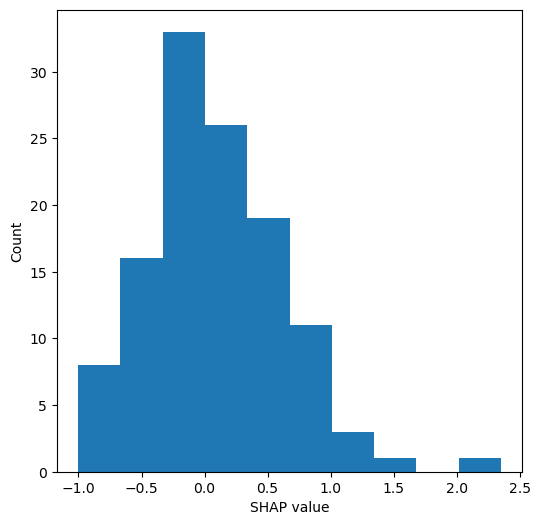

In [632]:
stroke_team_mean_shap_should_not = create_stroke_team_mean_shap_for_histogram(stroke_team_test_should_not, shap_values_should_not, feature_names_ohe, X_test_should_not)
# Plot histogram
fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot()
ax.hist(stroke_team_mean_shap_should_not)#, bins=np.arange(-1.5, 1.51, 0.1))
ax.set_xlabel('SHAP value')
ax.set_ylabel('Count')

filename = os.path.join(paths.data_save_path, 
                        (paths.notebook + paths.model_text + 
                         '_hosp_shap_hist_should not.jpg'))
plt.savefig(filename, dpi=300, bbox_inches='tight', pad_inches=0.2)
plt.show()

We see that there are some patients with a stroke severity of 10-20 NIHSS that should not get treated, but did. This is surprising as NIHSS 10-20 would be deemed as a good characteristic for IVT. 

These patients must have non ideal values fo other features. 

Look at how many of the non ideal characteristics these patients have, using these values as non ideal values:
* Prior disability: mRS3+
* Age: > 85
* Onset to treatment: >180 mins
* AF: 1 

Extract patients that we pridict to not have a benefit from treatment, but the decision was to receive treatment, that have stroke severity NIHSS 10-20

In [633]:
mask = (X_test_should_not["stroke_severity"] >= 10) * (X_test_should_not["stroke_severity"] <= 20)
X_test_should_not_NIHSS_10_20 = X_test_should_not[mask]

In [634]:
count_non_ideal = (X_test_should_not_NIHSS_10_20["prior_disability"]>=3)*1
count_non_ideal += (X_test_should_not_NIHSS_10_20["age"]>=85)*1
count_non_ideal += (X_test_should_not_NIHSS_10_20["onset_to_thrombolysis_time"]>=180)*1
count_non_ideal += (X_test_should_not_NIHSS_10_20["any_afib_diagnosis"]==1)*1

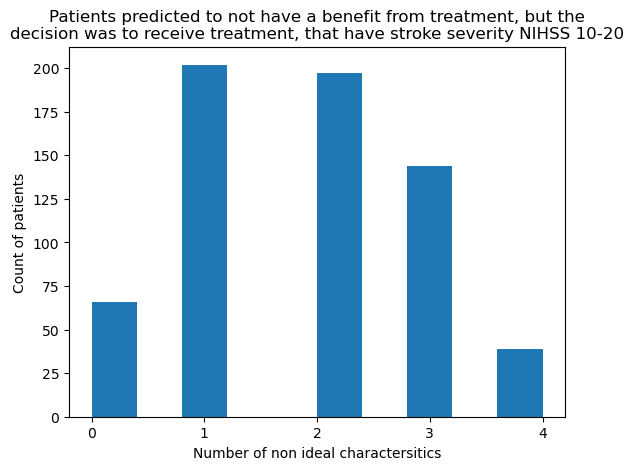

In [635]:
# Creating histogram 
fig, ax = plt.subplots(1, 1) 
ax.hist(count_non_ideal) 

xticks = count_non_ideal
  
# Set title 
ax.set_title("Patients predicted to not have a benefit from treatment, but the\ndecision was to receive treatment, that have stroke severity NIHSS 10-20") 
  
# adding labels 
ax.set_xlabel('Number of non ideal charactersitics') 
ax.set_xticks(np.sort(count_non_ideal.unique())) 
ax.set_ylabel('Count of patients') 
  
# Show plot 
plt.show() 


There are 66 patients that seem to have ideal characteristic values, but believed to not have the best outcome with treatment.

Look at the waterfall SHAP for one of these patients, to see how get their outcome values with and without treatment.

In [636]:
X_test_should_not_NIHSS_10_20_no_non_ideal = X_test_should_not_NIHSS_10_20[count_non_ideal==0]
X_test_should_not_NIHSS_10_20_no_non_ideal 

,prior_disability,stroke_severity,age,onset_to_thrombolysis_time,any_afib_diagnosis,precise_onset_known,team_Addenbrooke's Hospital,team_Basildon University Hospital,team_Blackpool Victoria Hospital,team_Bradford and Airedale SU,...,team_Whiston Hospital HASU,team_William Harvey Hospital,team_Wirral Arrowe Park Hospital,team_Withybush General Hospital,team_Worcestershire Royal Hospital,team_Worthing Hospital,team_Wycombe General Hospital,team_Yeovil District Hospital,team_York Hospital,team_Ysbyty Gwynedd
52126,0,11,62.5,113.0,0.0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
135891,0,19,82.5,173.0,0.0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
163891,0,13,62.5,139.0,0.0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4390,1,18,72.5,16.0,0.0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11904,0,12,72.5,45.0,0.0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
151591,1,18,82.5,154.5,0.0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
138439,0,20,82.5,165.0,0.0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
155456,0,15,62.5,114.5,0.0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
31202,0,11,77.5,55.0,0.0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Get index of one of these patients. Want to get that patients SHAP values for the outcome model.

Create dataframe of this patient with, and without, treatment

(this patient had thrombectomy, and outcome at discharge was mRS0. Is this a fair patient to look at?)

In [786]:
choose_patient = 1

In [787]:
patient_index = X_test_should_not_NIHSS_10_20_no_non_ideal.index[choose_patient]
X_ideal_patient_best_not_treat = X_outcome.loc[patient_index]
y_ideal_patient_best_not_treat = y_outcome.loc[patient_index]
X_ideal_patient_best_not_treat_100 = X_ideal_patient_best_not_treat.copy(deep=True)
X_ideal_patient_best_not_treat_100["onset_to_thrombolysis_time"] = -100
X_ideal_patient_treat_and_not = pd.concat([X_ideal_patient_best_not_treat, X_ideal_patient_best_not_treat_100], axis=1)
X_ideal_patient_treat_and_not = X_ideal_patient_treat_and_not.transpose()
X_ideal_patient_treat_and_not

,prior_disability,stroke_severity,age,onset_to_thrombolysis_time,any_afib_diagnosis,precise_onset_known,team_Addenbrooke's Hospital,team_Basildon University Hospital,team_Blackpool Victoria Hospital,team_Bradford and Airedale SU,...,team_Whiston Hospital HASU,team_William Harvey Hospital,team_Wirral Arrowe Park Hospital,team_Withybush General Hospital,team_Worcestershire Royal Hospital,team_Worthing Hospital,team_Wycombe General Hospital,team_Yeovil District Hospital,team_York Hospital,team_Ysbyty Gwynedd
135891,0.0,19.0,82.5,173.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
135891,0.0,19.0,82.5,-100.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [788]:
team_col_names_should = [col for col in list(X_ideal_patient_treat_and_not) if "team_" in col]
X_ideal_patient_treat_and_not[team_col_names_should].idxmax(axis=1)

135891    team_Gloucestershire Royal Hospital
135891    team_Gloucestershire Royal Hospital
dtype: object

Calculate probability distribution of mRS for this patient having received treatment, and not.

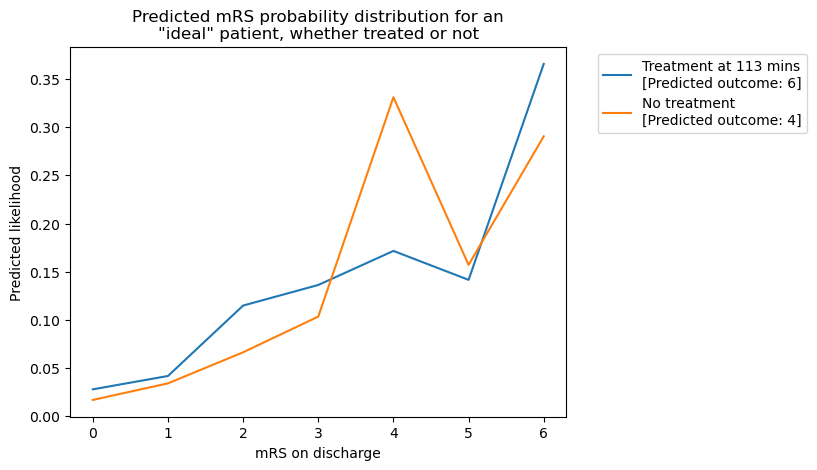

In [789]:
y_outcome_probs_treat_and_not = model_outcome.predict_proba(X_ideal_patient_treat_and_not)
y_outcome_pred_treat_and_not = model_outcome.predict(X_ideal_patient_treat_and_not)
y_outcome_pred_treat_and_not

label = [f"Treatment at 113 mins\n[Predicted outcome: {y_outcome_pred_treat_and_not[0]}]", 
         f"No treatment\n[Predicted outcome: {y_outcome_pred_treat_and_not[1]}]"]
for i in range(2):
    plt.plot(mrs_classes, y_outcome_probs_treat_and_not[i,:], label=label[i])

plt.legend(loc='upper right', bbox_to_anchor=(1.5, 1))
plt.xlabel('mRS on discharge')
plt.ylabel('Predicted likelihood')
plt.title('Predicted mRS probability distribution for an\n"ideal" patient, whether treated or not')

plt.show()

Calculate the two parts of determining if better outcome to get treated:
* Weighted mRS
* likelihood of bad outcome (mRS5+)

In [790]:
weighted_mrs = (y_outcome_probs_treat_and_not * mrs_classes).sum(axis=1)
data_for_df = np.array([[1,0], weighted_mrs.tolist(), y_outcome_probs_treat_and_not[:,5:].sum(axis=1).tolist()])
columns = ["treated", "weighted_mrs", "likelihood_mrs5+"]
df_best_outcome = pd.DataFrame(data=data_for_df.transpose(), columns=columns)
df_best_outcome

,treated,weighted_mrs,likelihood_mrs5+
0,1.0,4.269035,0.507244
1,0.0,4.330991,0.447657


Choose to not treat, as worse weighted ave mRS and increased likelihood bad outcome for treatment.

Look at the SHAP values for getting these mRS probabilty distributions. 

Load the SHAP explainer for the outcome model (as created in notebook 041)

In [791]:
explainer_filename = os.path.join(paths.data_save_path, 
                            ('041_xgb_7_features_5fold_shap_explainer_0.p'))


with open(explainer_filename, 'rb') as filehandler:
    explainer = pickle.load(filehandler)

shap_values_extended_ideal_patient_treat_and_not = explainer(X_ideal_patient_treat_and_not)

In [792]:
def create_waterfall_multiclass_grid(
                row, n_classes, k, y_data_row, shap_values_list_row,
                list_base_values, X_data_row, feature_names, pred_mrs_row, 
                str_treatment_description, str_treatment_received, patient_index):


    """
    Create a matrix of subplots per class. Each showing the relationship between
    each combination of features on the SHAP value.
    Setup matrix of subplots
    
    Args:
        row [integer]: the instance
        n_classes [list]: Class names
        k [integer]: kfold
        y_data_row [string]: the observed class
        shap_values_list_row [list]: shap values
        list_base_values [list]: base values
        X_data_row [series]: feature values for instance
        feature_names [list]: feature names
        pred_mrs_row [string]: the predicted class

    Return:
        None
    """
    fig = plt.figure()

    # Set overall title
    fig.suptitle(f'Waterfall for a single instance (index: {patient_index}).\n'
                 f'Observed discharge mRS {str_treatment_received}: {y_data_row}.\n'
                 f'Predicted discharge mRS ({str_treatment_description}): {pred_mrs_row}.\n'
                 f'(a subplot for each mRS class)',
                fontsize=20)

    for c in range(n_classes):
        ax = fig.add_subplot(4,2,c+1)
        shap.waterfall_plot(shap.Explanation(values=shap_values_list_row[c], 
                                            base_values=list_base_values[c], 
                                            data=X_data_row,  
                                            feature_names=feature_names), 
                                            show=False)
        ax.set_title(f"Predicting discharge mRS {c}")
        
    plt.gcf().set_size_inches(20,15)
    plt.tight_layout()

    filename = os.path.join(paths.image_save_path, 
                        (paths.notebook + paths.model_text + 
                         '_waterfall_for_each_class.jpg'))
    plt.savefig(filename, dpi=300)

    plt.show()

    return()
    

In [793]:
def create_str_treatment_received(onset_to_thrombolysis_time, get_mt):
                                  
    get_ivt = 1
    if onset_to_thrombolysis_time < 0:
        get_ivt = 0

    str_treatment_received = "("
    if get_ivt:
        str_treatment_received = str_treatment_received + "got IVT"
        if get_mt:
            str_treatment_received = str_treatment_received + ", and got MT)"
        else:
            str_treatment_received = str_treatment_received + ")"
    else:
        if get_mt:
            str_treatment_received = str_treatment_received + "got MT)"
        else:
            str_treatment_received = str_treatment_received + "(got neither treatment)"

    return(str_treatment_received)

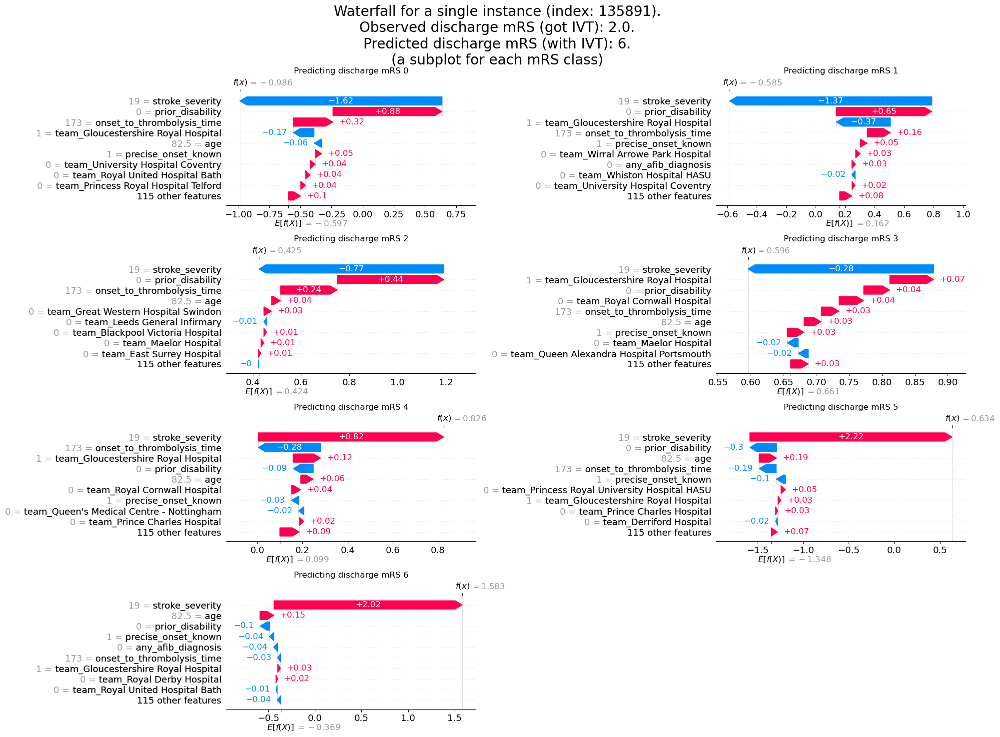

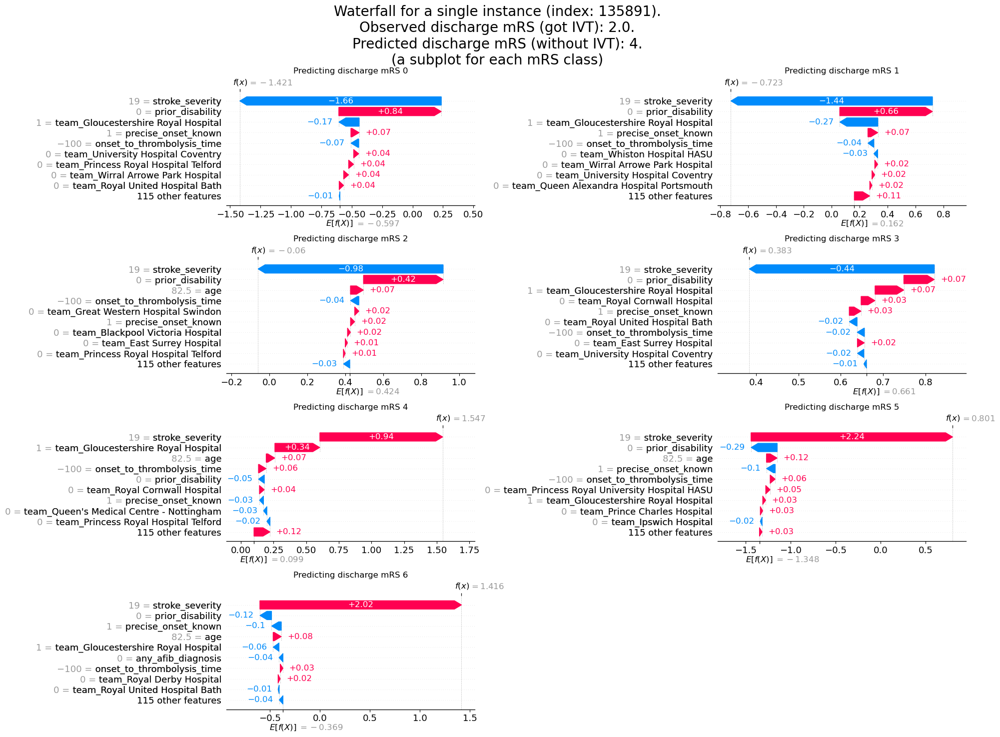

In [794]:
# Select kfold
k = 0
n_classes = 7

str_treatment_received = create_str_treatment_received(data_all_features["onset_to_thrombolysis_time"].loc[patient_index], 
                       data_all_features["thrombectomy"].loc[patient_index])

str_treatment_description = ["with IVT", "without IVT"]

for instance in range(2):
    # Initialise empty list
    list_shap_values = []
    list_base_values = []

    # Putting the SHAP values in the required format
    for c in range(n_classes):
        list_shap_values.append(shap_values_extended_ideal_patient_treat_and_not.values[instance,:,c])
        list_base_values.append(shap_values_extended_ideal_patient_treat_and_not.base_values[instance,c])

    # Get prediction for this kfold
    y_pred = y_outcome_pred_treat_and_not 

    # Call function to create subplots
    create_waterfall_multiclass_grid(instance, n_classes, k,
                                    y_ideal_patient_best_not_treat, 
                                    list_shap_values,
                                    list_base_values, X_ideal_patient_treat_and_not.iloc[instance], 
                                    feature_names_ohe, y_pred[instance], str_treatment_description[instance], 
                                    str_treatment_received, patient_index)

Seen why patient categorised as not best outcome to give IVT. 

But what characteristics about this patient that made the high benchmark decision to treat?

In [795]:
def get_benchmark_decision(X_data, model, benchmark_hospitals, 
                           ohe_stroke_team_feature_names):


    # Initialise dataframe to store each of the high benchmark hospital decisions 
    # for all of the patients
    df_treatment_results = pd.DataFrame(index=data.index)

    # Send all patients to each high benchmark hosptial, get treatment decision
    for h in benchmark_hospitals:
        X_data[ohe_stroke_team_feature_names] = 0
        X_data[f"team_{h}"] = 1
        df_treatment_results[f"{h}"] = (model.predict(X_data))

    # Calculate the majority vote from the 25 benchmark hosptials
    # Store whether each patient recieved thrombolysis in this scenario
    mask_treated = (df_treatment_results.sum(axis=1) > (len(benchmark_hospitals)/2))

    return(mask_treated.values)

In [796]:
# List of high benchmark hospitals
filename = os.path.join(paths.data_save_path, 
    ('200_xgb_9_features_all_data_thrombolysis_decision_ranked_hospitals_median_shap.csv'))

benchmark_hospitals = pd.read_csv(filename)

# Extract top 25 hospitals
high_benchmark_hospitals = list(benchmark_hospitals['hospital'].head(25))


# Load model to get thrombolysis decision based on benchmark hospitals

# Model filename
filename_treatment_model = os.path.join(paths.model_save_path, 
                '200_xgb_9_features_all_data_thrombolysis_decision.p')
model_treatment_decision = load_xgboost_model(filename_treatment_model)

# Get dataset for the treatment decision model
X_treatment = data[selected_features_treatment_ohe].copy(deep=True)
y_treatment = 'S2Thrombolysis'

X_treatment.loc[patient_index]

prior_disability                  0.0
stroke_severity                  19.0
age                              82.5
arrival_to_scan_time             20.0
precise_onset_known               1.0
                                 ... 
team_Worthing Hospital            0.0
team_Wycombe General Hospital     0.0
team_Yeovil District Hospital     0.0
team_York Hospital                0.0
team_Ysbyty Gwynedd               0.0
Name: 135891, Length: 126, dtype: float64

In [797]:
# Determine the benchmark treatment decision
mask_treated = get_benchmark_decision(X_treatment, 
                                      model_treatment_decision, 
                                      high_benchmark_hospitals,
                                      ohe_stroke_team_feature_names)

In [798]:
patient_row = X_treatment.index.get_loc(patient_index)
mask_treated[patient_row]

True

Look at the SHAP for each of the 25 hospitals

In [799]:
def load_shap_explainer(filename):

    # Check if exists
    file_exists = exists(filename)

    if file_exists:
        # Load SHAP explainer
        with open(filename, 'rb') as filehandler:
            explainer = pickle.load(filehandler)
    else:
        # Print error
        file_notebook = filename[:3]
        print(f"Run notebook {file_notebook} first to train the model")
    return(explainer)

In [800]:
# SHAP explainer filename
filename_shap_explainer = os.path.join(paths.data_save_path, 
                ('200_xgb_9_features_all_data_thrombolysis_decision_shap_explainer.p'))

explainer_treatment_decision = load_shap_explainer(filename_shap_explainer)

In [801]:
X_data = X_treatment.loc[patient_index]
benchmark_hospitals = high_benchmark_hospitals
model = model_treatment_decision

# Initialise dataframe to store each of the high benchmark hospital decisions 
# for all of the patients
X_single_patient_attend_high_benchmarks = pd.DataFrame(columns=X_treatment.columns)

# Add up the number of hosptials that voted Yes to treat.

count = 0
# Send all patients to each high benchmark hosptial, get treatment decision
for h in benchmark_hospitals:
    X_data[ohe_stroke_team_feature_names] = 0
    X_data[f"team_{h}"] = 1
    X_single_patient_attend_high_benchmarks = X_single_patient_attend_high_benchmarks.append(X_data)
    # Put the series as a single row into a dataframe
    df_X_data = pd.DataFrame([X_treatment.loc[patient_index].tolist()], columns=X_treatment.loc[patient_index].index)
    count += (model.predict(df_X_data))[0]

print(f"{count} out of 25 high benchmark hosptials voted 'Yes' to treat")
shap_extended_treatment_decision = explainer_treatment_decision(X_single_patient_attend_high_benchmarks)

25 out of 25 high benchmark hosptials voted 'Yes' to treat


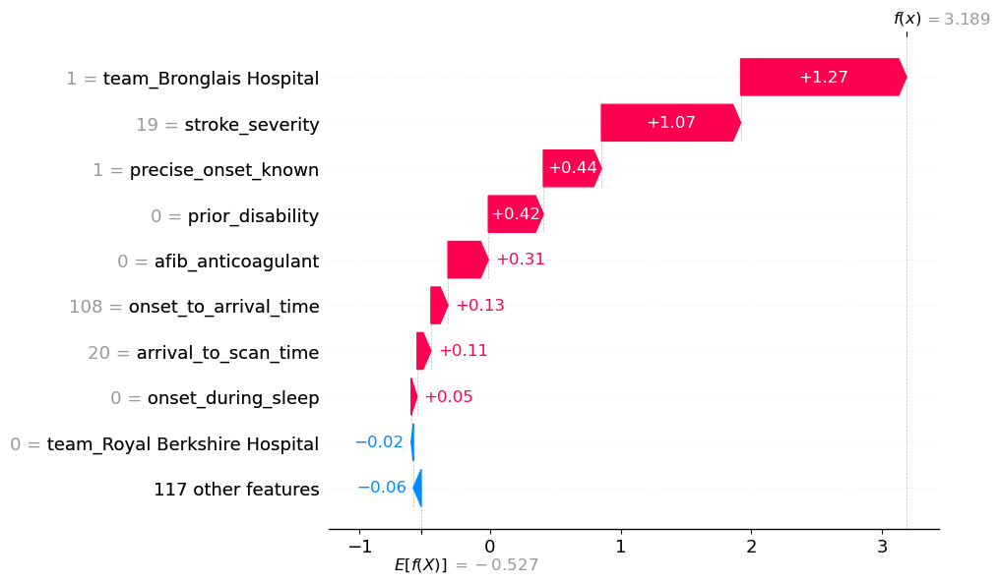

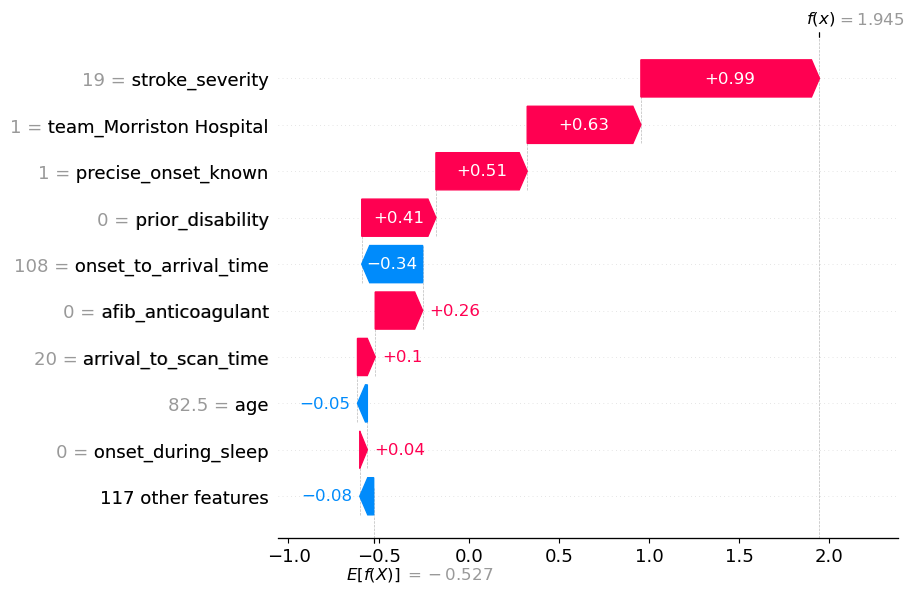

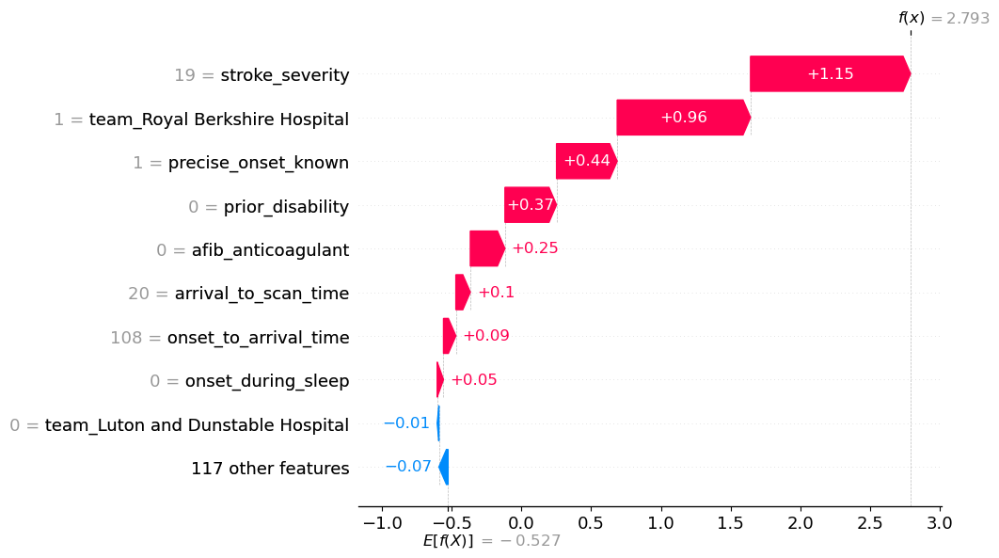

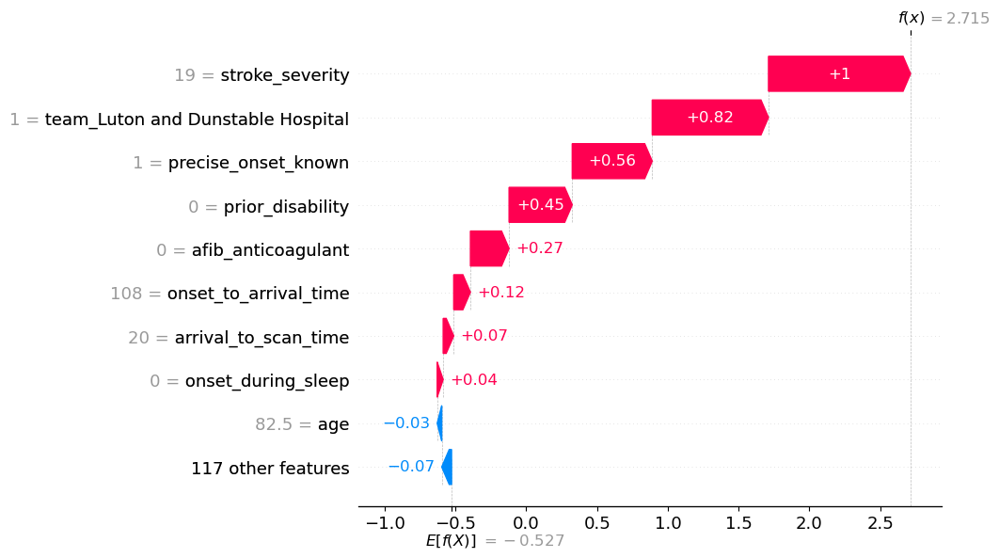

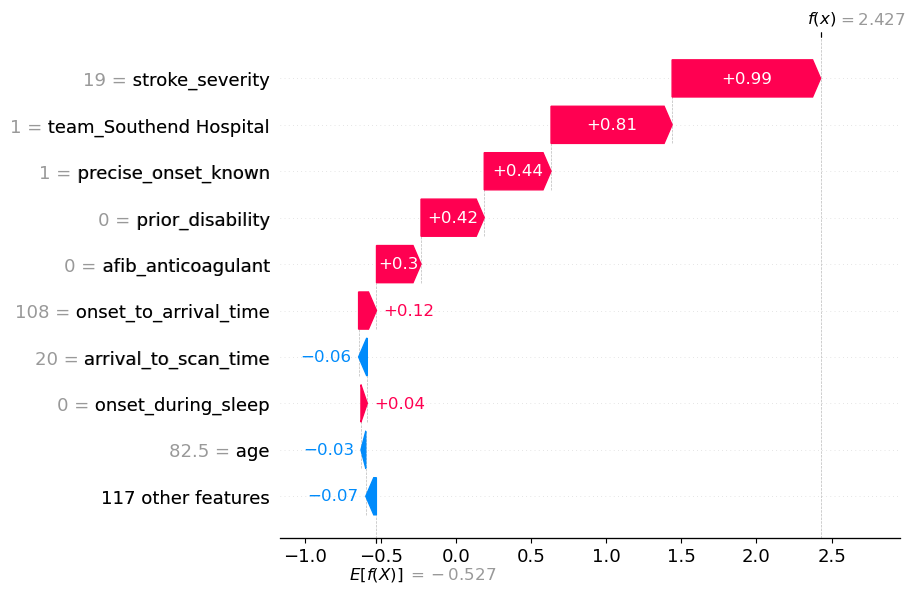

...

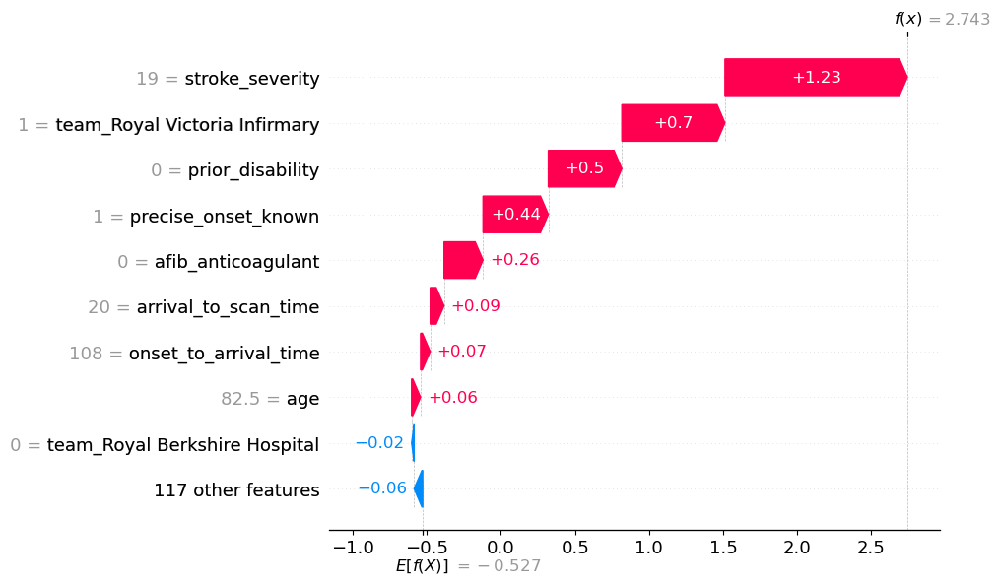

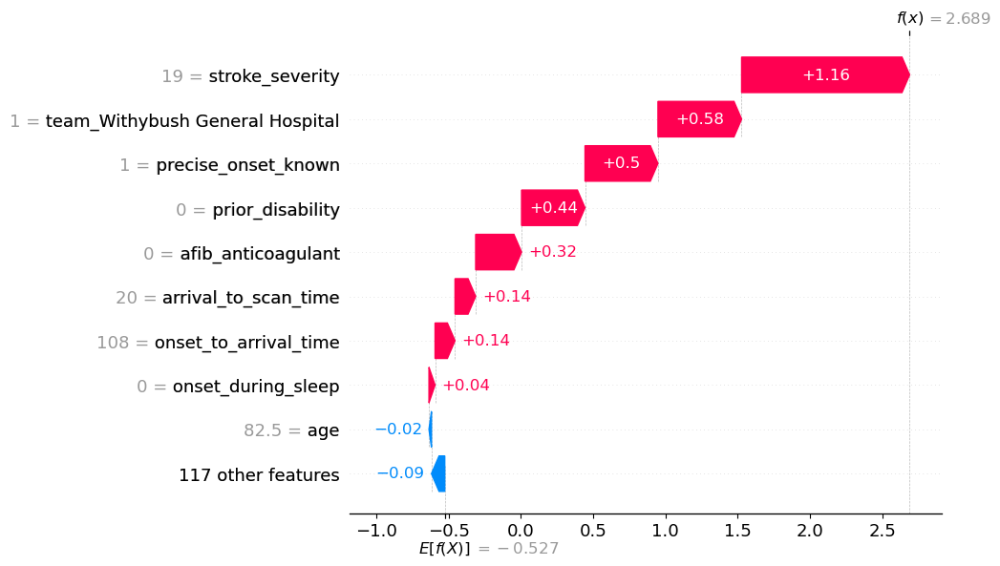

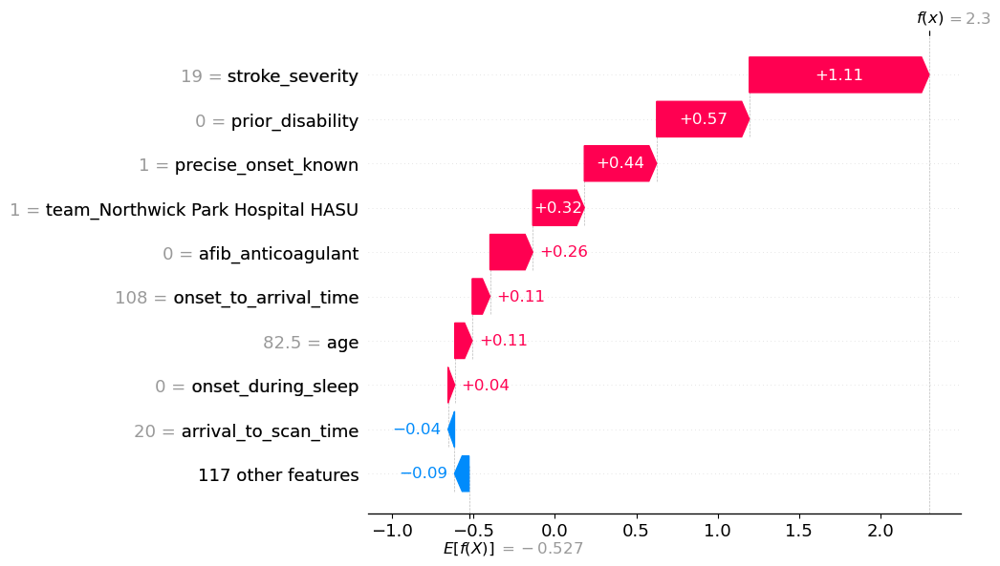

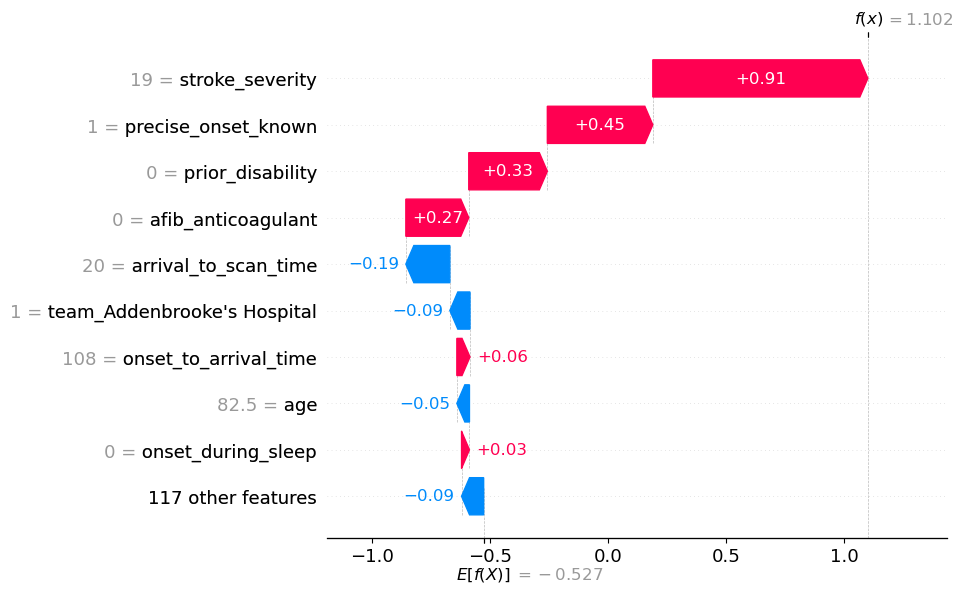

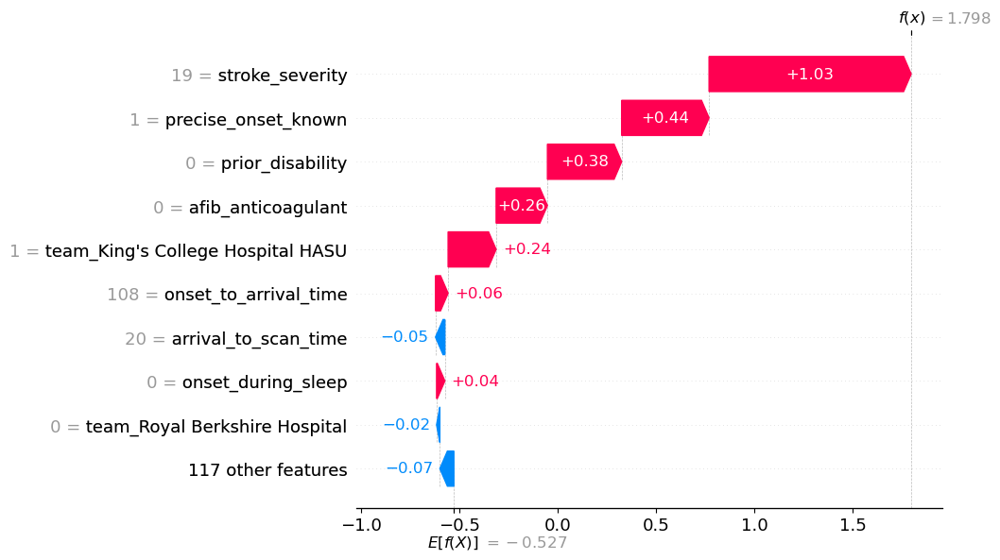

In [802]:
for i in range(shap_extended_treatment_decision.shape[0]):
    shap.waterfall_plot(shap.Explanation(values=shap_extended_treatment_decision[i,:].values,
                                     base_values=shap_extended_treatment_decision.base_values[i], 
                                     data=X_single_patient_attend_high_benchmarks.iloc[i],  
                                     feature_names=X_single_patient_attend_high_benchmarks.columns.tolist()))

In [803]:
instance = ??

shap.waterfall_plot(shap.Explanation(values=shap_values_should_not[instance,:],
                                     base_values=shap_values_extended_should_not.base_values[instance], 
                                     data=X_test_should_not.iloc[instance],  
                                     feature_names=X_test_should_not.columns.tolist()))

SyntaxError: invalid syntax (230313979.py, line 1)

## Predicting best outcome.

Fit model (use all the patient data) to predict whether patient gets best outcome from treatment (using our definition that best outcome using treatment is when the patient has an increased likelihood of a lower weighted mRS, and reduced likelihood of a bad outcome, being mRS5+). 

Can then look at the SHAP value for onset to treatment time to see what imapact time to treatme has on whether treatment gives a good outcome.

Can look at this result be subgroups of patients (such as mild vs moderate and severe strokes).

In [ ]:
# Target is get best outcome with treatment
y_bin_best_outcome = df_treatment_decision_per_scenario["Lowest_weighted_mrs_and_least_mrs5_6"]

# Get the X data
X_bin_best_outcome = data_outcome.drop('discharge_disability', axis=1).copy(deep=True)

# Set up or load test and train data
filename = os.path.join(paths.model_save_path, 
                            (paths.notebook + 'dictionary_train_test_bin_best_outcome.p'))

(X_train_bin_best_outcome, X_test_bin_best_outcome, y_train_bin_best_outcome, y_test_bin_best_outcome) = (
                        create_train_test_split(filename, X_bin_best_outcome, y_bin_best_outcome, test_size=0.25))

Extract team attended for the patietns in the test set

In [ ]:
team_col_names = [col for col in list(X_test_bin_best_outcome) if "team_" in col]
stroke_team_test_bin_best_outcome = X_test_bin_best_outcome[team_col_names].idxmax(axis=1)
stroke_team_test_bin_best_outcome = [s.replace('team_', '') for s in stroke_team_test_bin_best_outcome]

In [ ]:
# Set up and fit model
filename = os.path.join(paths.model_save_path, 
                            (paths.notebook + paths.model_text + '_bin_best_outcome.p'))
model_xgb_bin_best_outcome = create_xgboost_model(filename, X_train_bin_best_outcome, y_train_bin_best_outcome)

# Predict training and test set labels
y_pred_train_xgb_bin_best_outcome = model_xgb_bin_best_outcome.predict(X_train_bin_best_outcome)
y_pred_test_xgb_bin_best_outcome = model_xgb_bin_best_outcome.predict(X_test_bin_best_outcome)

# Calculate accuracy of training and test sets
accuracy_train_bin_best_outcome = np.mean(y_pred_train_xgb_bin_best_outcome == y_train_bin_best_outcome)
accuracy_test_bin_best_outcome = np.mean(y_pred_test_xgb_bin_best_outcome == y_test_bin_best_outcome)

print ('Accuracy of predicting training data =', accuracy_train_bin_best_outcome)
print ('Accuracy of predicting test data =', accuracy_test_bin_best_outcome)

Accuracy of predicting training data = 0.8712670508425122
Accuracy of predicting test data = 0.8438006039651625


In [ ]:
plot_cm(confusion_matrix(y_test_bin_best_outcome, y_pred_test_xgb_bin_best_outcome))
plt.show()

()

In [ ]:
# Show first ten predicted probabilities 
# (note how the values relate to the classes predicted above)
probabilities_xgb_bin_best_outcome = model_xgb_bin_best_outcome.predict_proba(X_test_bin_best_outcome)
probabilities_xgb_bin_best_outcome[0:10]

array([[0.12969398, 0.870306  ],
       [0.9384044 , 0.06159562],
       [0.00948375, 0.99051625],
       [0.08778626, 0.91221374],
       [0.910199  , 0.08980099],
       [0.35081917, 0.6491808 ],
       [0.8733915 , 0.12660852],
       [0.0077517 , 0.9922483 ],
       [0.713915  , 0.28608504],
       [0.3110065 , 0.6889935 ]], dtype=float32)

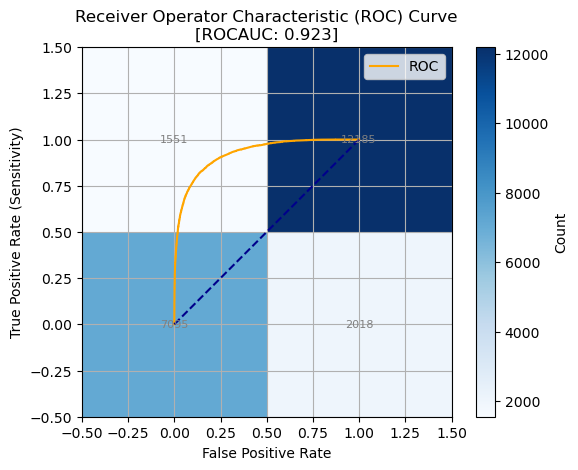

()

In [ ]:
# Get ROC curve using sklearn method
fpr, tpr, thresholds = roc_curve(y_test_bin_best_outcome, probabilities_xgb_bin_best_outcome[:,1]) 

# Plot ROC curve
plot_roc_curve(fpr, tpr)

In [ ]:
# Set filename
filename = os.path.join(paths.data_save_path, 
                        (paths.notebook + paths.model_text + 
                            f'_shap_values_extended_bin_best_outcome.p'))

explainer_filename = os.path.join(paths.data_save_path, 
                    (paths.notebook + paths.model_text + 
                        f'_shap_explainer_bin_best_outcome.p'))

# Get and store SHAP values
shap_values_extended_bin_best_outcome = calculate_shap_extended(model_xgb_bin_best_outcome, X_train_bin_best_outcome, X_test_bin_best_outcome, 
                                               filename, explainer_filename)
shap_values_bin_best_outcome = shap_values_extended_bin_best_outcome.values

# Get and store feature importances
shap_feature_importance_df = pd.DataFrame() # create empty DataFrame
shap_feature_importance_df['feature'] = list(X) # Get feature names from X
shap_feature_importance_df['importance'] = model_xgb_bin_best_outcome.feature_importances_
shap_feature_importance_df['abs(mean shap)'] = abs(shap_values_bin_best_outcome.mean(axis=0))
shap_feature_importance_df['mean(abs shap)'] = abs(shap_values_bin_best_outcome).mean(axis=0)
shap_feature_importance_df.sort_values(by='mean(abs shap)', ascending=False, inplace=True)

shap_feature_importance_df.head(20)

,feature,importance,abs(mean shap),mean(abs shap)
1,stroke_severity,0.031384,0.038113,1.969133
3,onset_to_thrombolysis_time,0.006910,0.013422,0.503069
0,prior_disability,0.005784,0.059351,0.260708
2,age,0.003119,0.006994,0.250652
5,precise_onset_known,0.002421,0.022919,0.134247
4,any_afib_diagnosis,0.002677,0.018510,0.126984
72,team_Royal Berkshire Hospital,0.016382,0.037474,0.069683
23,team_Eastbourne District General Hospital,0.010819,0.022214,0.049787
103,team_University Hospital Coventry,0.011697,0.010761,0.040175
84,team_Royal Sussex County Hospital,0.050305,0.031743,0.031743


In [ ]:
# Plot a SHAP summary plot
shap.summary_plot(shap_values_bin_best_outcome, X_test_bin_best_outcome.values, plot_type="bar", 
                  class_names=model_xgb_bin_best_outcome.classes_, 
                  feature_names = list(X), class_inds="original",
                  show=False, plot_size=(10,6))

In [ ]:
shap.summary_plot(shap_values_bin_best_outcome, X_test_bin_best_outcome.values, 
                    feature_names=X_test_bin_best_outcome.columns, show=False, 
                    plot_size=(12,5), plot_type='violin')

In [ ]:

shap.summary_plot(shap_values_bin_best_outcome, X_test_bin_best_outcome.values, 
                    feature_names=X_test_bin_best_outcome.columns, show=False, 
                    plot_size=(12,5))


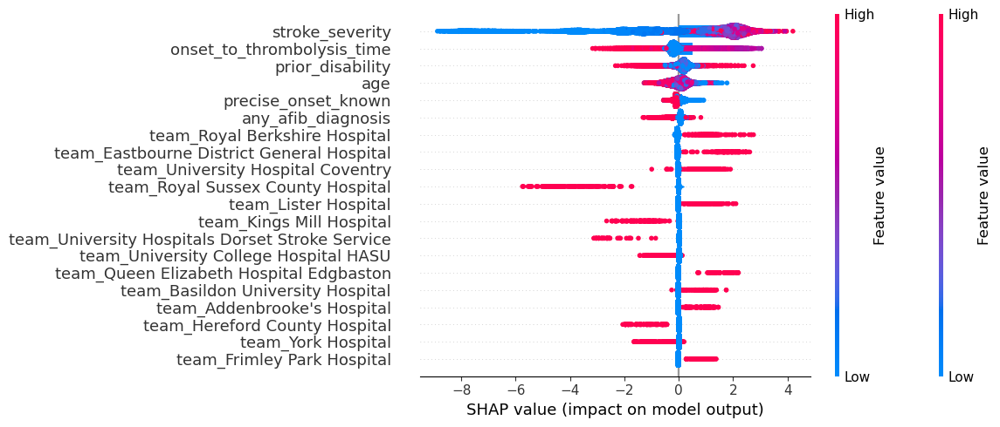

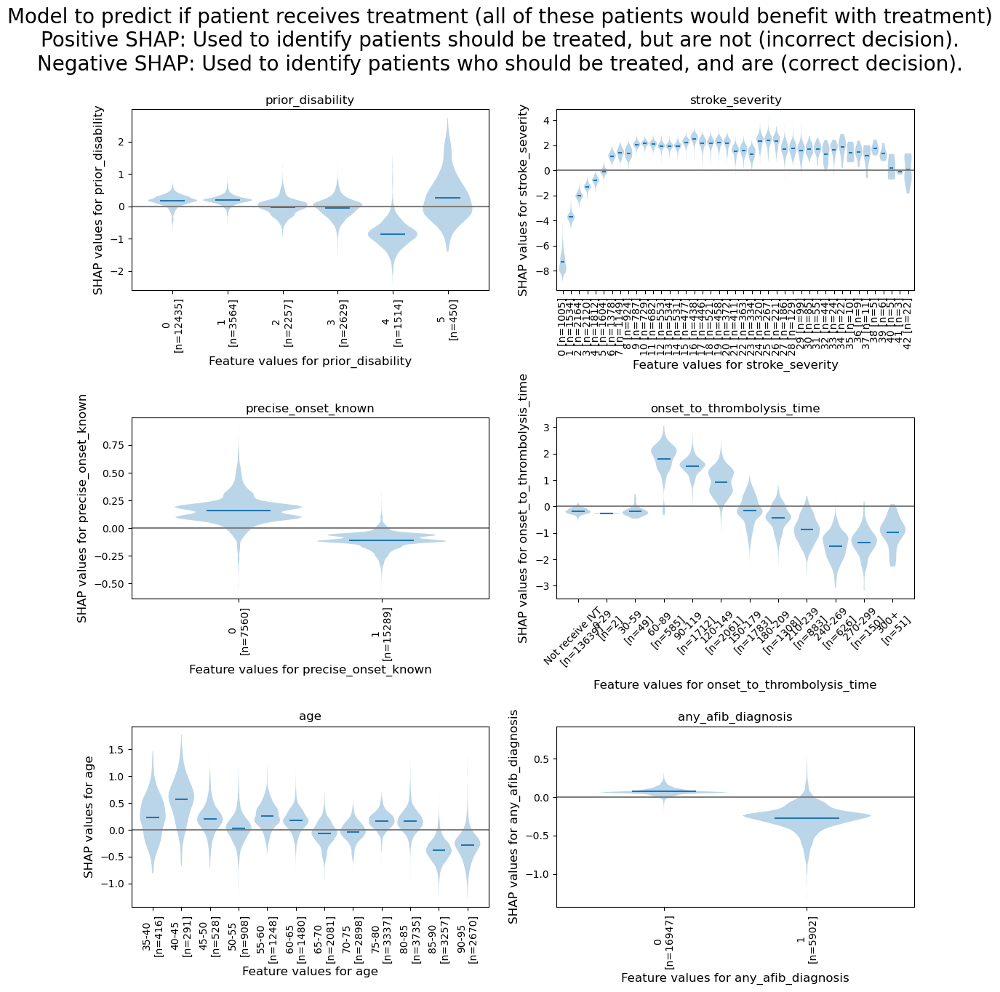

()

In [ ]:

# Features to include in the violin plot grid
features_violin = ["prior_disability", "stroke_severity", "precise_onset_known",
                "onset_to_thrombolysis_time", "age", "any_afib_diagnosis"]
filename = os.path.join(paths.image_save_path, (paths.notebook + 
                        paths.model_text + 
                        f'_thrombolysis_shap_violin_all_features_all_benefit_with_ivt_{s1_name}_{s2_name}.jpg'))

title = "Model to predict if patient receives treatment (all of these patients would benefit with treatment)\nPositive SHAP: Used to identify patients should be treated, but are not (incorrect decision).\nNegative SHAP: Used to identify patients who should be treated, and are (correct decision)."
create_grid_of_violin_plots(features_violin, 
                            shap_values_extended_bin_best_outcome,
                            title,
                            filename)


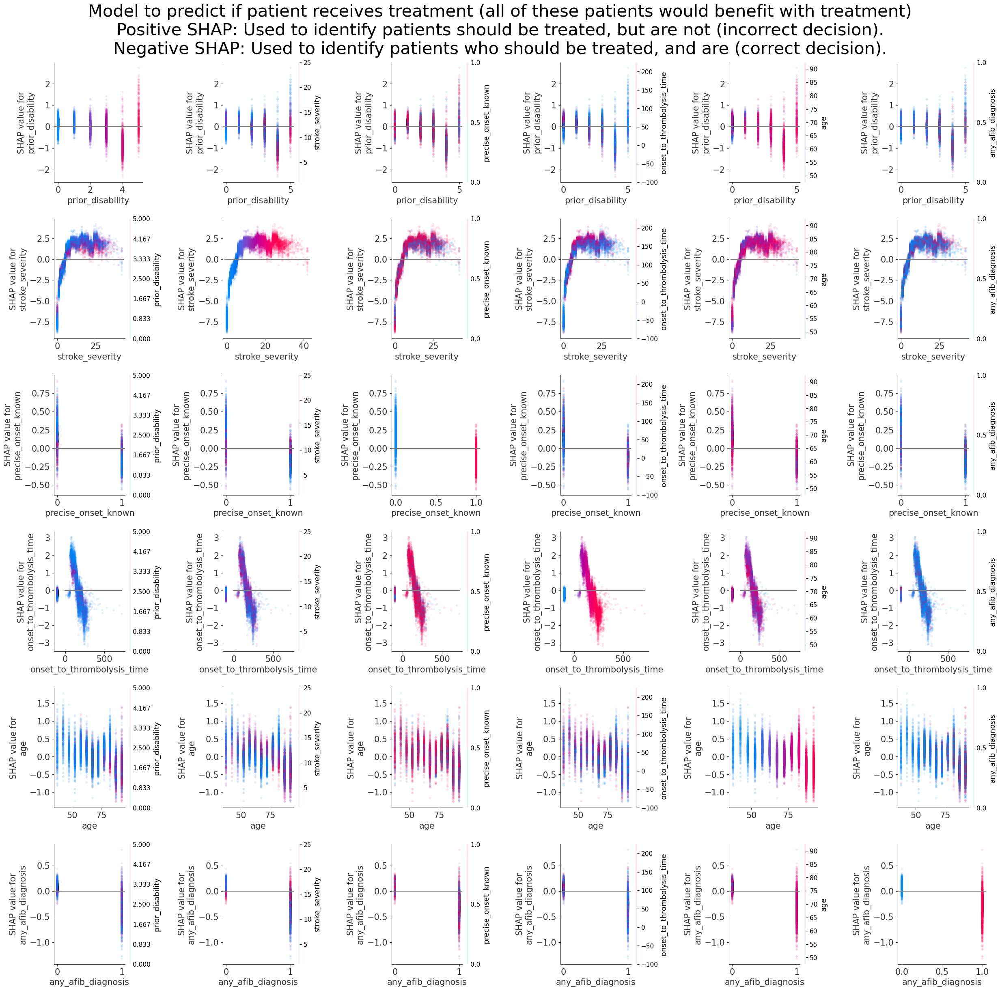

()

In [ ]:
features_to_show = ["prior_disability", "stroke_severity", "precise_onset_known",
                    "onset_to_thrombolysis_time", "age", "any_afib_diagnosis"]
title = "Model to predict if patient receives treatment (all of these patients would benefit with treatment)\nPositive SHAP: Used to identify patients should be treated, but are not (incorrect decision).\nNegative SHAP: Used to identify patients who should be treated, and are (correct decision)."
filename = os.path.join(paths.image_save_path, 
                            (paths.notebook + paths.model_text + 
                        f'_grid_of_dependency_plots_all_benefit_with_ivt_{s1_name}_{s2_name}.jpg'))
create_grid_of_dependence_plots(features_to_show, title, shap_values_bin_best_outcome, X_test_bin_best_outcome, feature_names_ohe, filename)

In [ ]:
shap_values_bin_best_outcome.shape

(22849, 124)

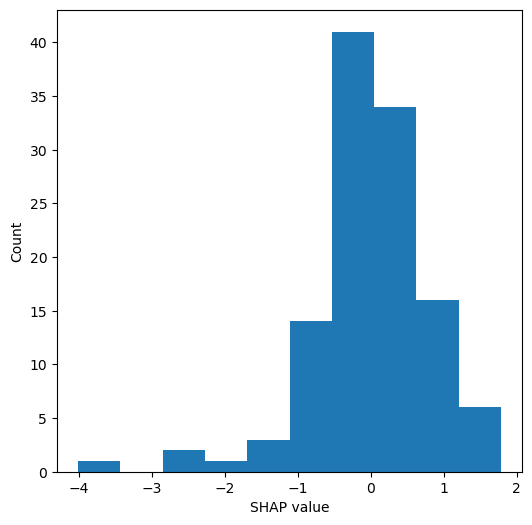

In [ ]:
stroke_team_mean_shap_bin_best_outcome = (
    create_stroke_team_mean_shap_for_histogram(stroke_team_test_bin_best_outcome, 
      shap_values_bin_best_outcome, feature_names_ohe, X_test_bin_best_outcome))

# Plot histogram
fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot()
ax.hist(stroke_team_mean_shap_bin_best_outcome)#, bins=np.arange(-1.5, 1.51, 0.1))
ax.set_xlabel('SHAP value')
ax.set_ylabel('Count')

filename = os.path.join(paths.data_save_path, 
                        (paths.notebook + paths.model_text + 
                         '_hosp_shap_hist_bin_best_outcome.jpg'))
plt.savefig(filename, dpi=300, bbox_inches='tight', pad_inches=0.2)
plt.show()

In [ ]:
def violin_subpopulations(list_masks, list_titles, feature_data, feature_shap, 
                          rotation, feat,
                          bin_list, step, n_bins): 

    # A subplot showing violin plot for each feature.
    # First prepare the fature data for the violin plot: if feature has more than 
    # 50 unique values then assume it needs to be binned (a violin for each bin)

    # Initialise vlaues so they can be immediately improved. Stores the overall min and max of y axis ranges for all subplots.
    ymin = 999
    ymax = -999

    # Determine number of rows of subplots by rounding up
    ncols = min(len(list_masks),2)
    nrows = int(math.ceil(len(list_masks)/ncols))

    figwidth = 12
    figheight = 7 * nrows

    # Create figure
    fig = plt.figure(figsize=(figwidth,figheight), constrained_layout=True)

    fig.suptitle(f'Model to predict best outcome', fontsize=20)

    plot_mean_shap_per_category = []
    plot_median_shap_per_category = []
    plot_sem_shap_per_category = []

    for i in range(len(list_titles)):
        feature_data_plot = feature_data[list_masks[i]]
        feature_shap_plot = feature_shap[list_masks[i]]

        if np.unique(feature_data).shape[0] > 50:            
            # Number of instances per bin
            #counts, edges, plot = plt.hist(feature_data, bins=bin_list)
            counts, edges = np.histogram(feature_data_plot, bins=bin_list, 
                                         density=False)

            # create list of bins (the unique categories)
            category_list = [f'{i*step}-{((i+1)*step-1)}\n[n={int(counts[i+1])}]' for i in range(n_bins-1)]
            category_list.append(f'{(n_bins-1)*step}+\n[n={int(counts[-1])}]')
            if feat == "onset_to_thrombolysis_time":
                # for -100 for no IVT
                category_list.insert(0, f'Not receive IVT\n[n={int(counts[0])}')

            # bin the feature data
            feature_data_plot = pd.cut(feature_data_plot, bin_list, labels=category_list, 
                                right=False)

        else:
            category_list = np.unique(feature_data)

        # create a list, each entry contains the corresponsing SHAP value for that 
        # category (or bin). A violin will represent each list.    
        shap_per_category = []
        mean_shap_per_category = []
        median_shap_per_category = []
        sem_shap_per_category = []
        if np.unique(feature_data).shape[0] < 51:            
            count = []

        for category in category_list:
            mask = feature_data_plot == category
            shap_per_category.append(feature_shap_plot[mask])
            mean = feature_shap_plot[mask].mean()
            mean_shap_per_category.append(mean)
            median = np.median(feature_shap_plot[mask])
            median_shap_per_category.append(median)
            stddev = np.std(feature_shap_plot[mask])
            sem_shap_per_category.append(stddev/math.sqrt(mask.sum()))
            if np.unique(feature_data).shape[0] < 51:            
                count.append(mask.sum())

        if np.unique(feature_data).shape[0] < 51:       
            if feat == 'stroke_severity':
                # not enough space of chart for 2 lines fo x tick labels
                category_list = [f'{category_list[i]} [n={count[i]}]' for i in range(len(category_list))]
            else:
                category_list = [f'{category_list[i]}\n[n={count[i]}]' for i in range(len(category_list))]

        # create violin plot
        ax = fig.add_subplot(nrows,ncols,i+1)

        # https://stackoverflow.com/questions/33822239/matplotlib-violinplot-valueerror-with-empty-lists
        nans = [float('nan'), float('nan')] # requires at least 2 nans

        ax.violinplot([val if val.any() else nans for val in shap_per_category], 
                  showmeans=True, widths=0.9, showextrema=False)

    #    ax.violinplot(shap_per_category, showmeans=True, widths=0.9)

        # Add line at Shap = 0
        # KP HERE (origianl 2 lines replaced by the one below the commented lines)
#        feature_values = shap_values_extended[:, feat].data
#        ax.plot([0, len(feature_values)], [0,0],c='0.5')   
        ax.plot([0, len(feature_data)], [0,0],c='0.5')   

        # customise the axes
        ax = set_ax(ax, category_list, feat, rotation=rotation)
        plt.subplots_adjust(bottom=0.15, wspace=0.05)
        ymin = min(ax.get_ylim()[0], ymin)
        ymax = max(ax.get_ylim()[1], ymax)
        
        # Add title
        ax.set_title(list_titles[i])
        plot_mean_shap_per_category.append(mean_shap_per_category)
        plot_median_shap_per_category.append(median_shap_per_category)
        plot_sem_shap_per_category.append(sem_shap_per_category)

    plt.tight_layout(pad=2)

    # Use the same y limits for all of the subplots
    # To use the range from the first subplot use: ylim=ax[0,0].get_ylim()
    plt.setp(ax, ylim=(ymin,ymax))

    #fig.savefig(f'{paths.notebook}_{paths.model_text}_thrombolysis_shap_violin_all_'
    #        f'features_for_mRS{class_category}.jpg', 
    #        dpi=300, bbox_inches='tight', pad_inches=0.2)

    plt.show()
    return(plot_mean_shap_per_category, plot_median_shap_per_category, plot_sem_shap_per_category)

In [ ]:
def lineplot_subpopulations(plot_mean_shap_per_category, 
                            plot_sem_shap_per_category, feat, feature_data, 
                            rotation, list_titles, n_bins, step):
    # Create figure
    fig = plt.figure(figsize=(10,5), constrained_layout=True)
    ax = fig.add_subplot(1,1,1)

    if np.unique(feature_data).shape[0] < 50:            
        category_list = np.unique(feature_data)

    else:

        category_list = [f'{i*step}-{((i+1)*step-1)}' for i in range(n_bins-1)]
        category_list.append(f'{(n_bins-1)*step}+')
        if feat == "onset_to_thrombolysis_time":
                # for -100 for no IVT
                category_list.insert(0, f'Not receive IVT')


    for i in range(len(plot_mean_shap_per_category)):
        ax.errorbar(range(1,len(plot_mean_shap_per_category[i])+1), 
                plot_mean_shap_per_category[i],
                label=list_titles[i],
                yerr=plot_sem_shap_per_category[i])
    #ax.plot(range(43), plot_mean_shap_per_category[1])

    # Add line at Shap = 0
    ax.plot([0, len(plot_mean_shap_per_category[0])], [0,0],c='0.5')   

    # customise the axes
    ax = set_ax(ax, category_list, feat, rotation=rotation)
    plt.subplots_adjust(bottom=0.15, wspace=0.05)
    #ax.set_ylim(-1.9, 4.5)

    # Add title
    ax.set_title("Mean SHAP (sem) for feature onset to thrombolysis time, by stroke severity")

    ax.legend(loc=4)

    plt.tight_layout(pad=2)

    #fig.savefig(f'{paths.notebook}_{paths.model_text}_thrombolysis_shap_violin_all_'
    #        f'features_for_mRS{class_category}.jpg', 
    #        dpi=300, bbox_inches='tight', pad_inches=0.2)

    plt.show()

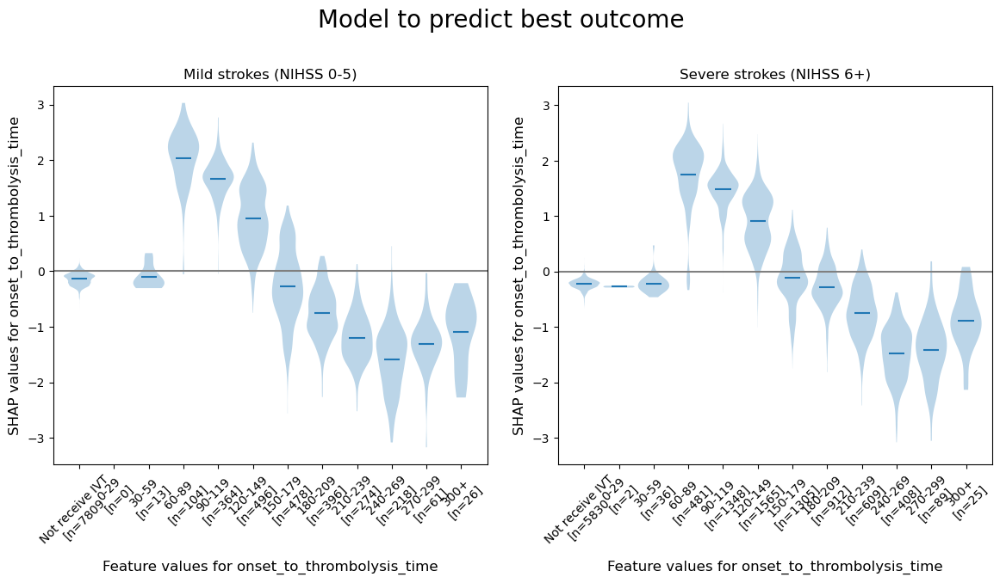

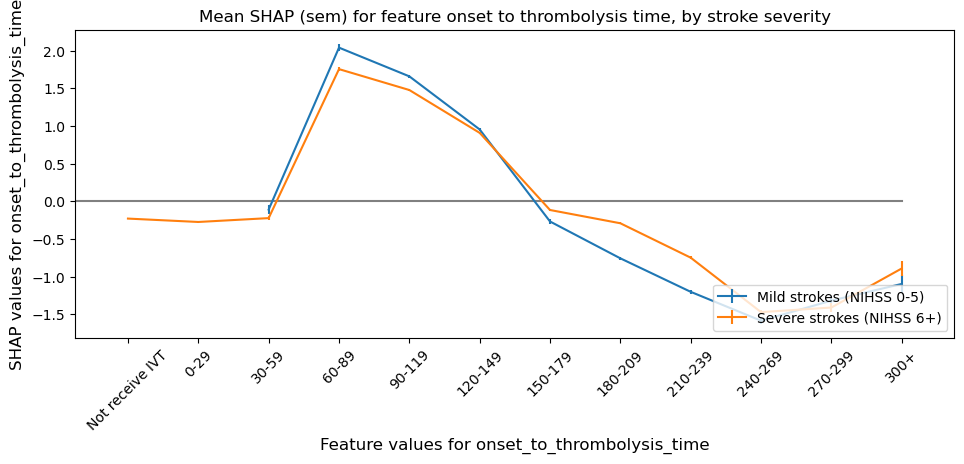

In [ ]:
feat = "onset_to_thrombolysis_time"

# Get data and SHAP values
feature_data = shap_values_extended_bin_best_outcome[:, feat].data
feature_shap = shap_values_extended_bin_best_outcome[:, feat].values

# settings for the plot
rotation = 45
step = 30
n_bins = min(11, np.int((feature_data.max())/step))

# create list of bin values
bin_list = [(i*step) for i in range(n_bins)]
bin_list.append(feature_data.max())
# for -100 for no IVT
bin_list.insert(0, feature_data.min())

# Divide based on stroke severity.
stroke_severity_data = (
        shap_values_extended_bin_best_outcome[:, "stroke_severity"].data)
list_masks = []
mask = stroke_severity_data < 6
list_masks.append(mask)
mask = stroke_severity_data > 5
list_masks.append(mask)

# check each instance is represented exactly once
sum = 0
for i in list_masks:
    sum = (sum + i.sum()) 
# print warning if each instance is not represented exactly once
if sum != (feature_data.shape[0]):
    print(f"{sum} patients out of {feature_data.shape[0]} total are represented"
           + " across the graphs")

list_titles = ["Mild strokes (NIHSS 0-5)", "Severe strokes (NIHSS 6+)"]

# Show these populations in violin subplots
(plot_mean_shap_per_category, 
 plot_median_shap_per_category, 
 plot_sem_shap_per_category) = violin_subpopulations(list_masks, list_titles, 
                        feature_data, feature_shap, rotation, 
                        feat, bin_list, step, n_bins)


lineplot_subpopulations(plot_mean_shap_per_category, plot_sem_shap_per_category, 
                        feat, feature_data, rotation, list_titles ,n_bins, step)
